<a href="https://colab.research.google.com/github/fpabi/ASE/blob/main/ASE_MORT.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import pandas as pd
import io
from google.colab import files
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from mpl_toolkits.mplot3d import axes3d
from mpl_toolkits import mplot3d
from ipywidgets import interact

In [7]:
uploaded = files.upload()

Saving pea.csv to pea.csv


In [5]:
mort_ninguna = pd.read_csv(io.BytesIO(uploaded["mort_ninguna.csv"]), sep=',', decimal='.')
mort_ninguna.shape

(32, 4)

In [7]:
mort_IMSS = pd.read_csv(io.BytesIO(uploaded["mort_IMSS.csv"]), sep=',', decimal='.')
mort_IMSS.shape

(32, 4)

In [9]:
mort_ISSTE = pd.read_csv(io.BytesIO(uploaded["mort_ISSTE.csv"]), sep=',', decimal='.')
mort_ISSTE.shape

(32, 4)

In [11]:
mort_PEMEX = pd.read_csv(io.BytesIO(uploaded["mort_PEMEX.csv"]), sep=',', decimal='.')
mort_PEMEX.shape

(32, 4)

In [13]:
mort_SEDENA = pd.read_csv(io.BytesIO(uploaded["mort_SEDENA.csv"]), sep=',', decimal='.')
mort_SEDENA.shape

(32, 4)

In [15]:
mort_SEMAR = pd.read_csv(io.BytesIO(uploaded["mort_SEMAR.csv"]), sep=',', decimal='.')
mort_SEMAR.shape

(32, 4)

In [17]:
mort_SP_INSABI = pd.read_csv(io.BytesIO(uploaded["mort_SP_INSABI.csv"]), sep=',', decimal='.')
mort_SP_INSABI.shape

(32, 4)

In [19]:
mort_otra = pd.read_csv(io.BytesIO(uploaded["mort_otra.csv"]), sep=',', decimal='.')
mort_otra.shape

(32, 4)

In [21]:
mort_general = pd.read_csv(io.BytesIO(uploaded["mortalidad_general.csv"]), sep=',', decimal='.')
mort_general.shape

(32, 4)

In [5]:
pob_general = pd.read_csv(io.BytesIO(uploaded["poblacion_total.csv"]), sep=',', decimal='.')
pob_general.shape

KeyError: ignored

In [3]:
derechohabiencia_general = pd.read_csv(io.BytesIO(uploaded["Derechohabiencia.csv"]), sep=',', decimal='.')
derechohabiencia_general.shape

(33, 10)

In [ ]:
esp_vida_2018 = pd.read_csv(io.BytesIO(uploaded["esp_vida_2018.csv"]), sep=',', decimal='.')
esp_vida_2018.shape

(33, 4)

In [ ]:
esp_vida_2019 = pd.read_csv(io.BytesIO(uploaded["esp_vida_2019.csv"]), sep=',', decimal='.')
esp_vida_2019.shape

(33, 4)

In [ ]:
esp_vida_2020 = pd.read_csv(io.BytesIO(uploaded["esp_vida_2020.csv"]), sep=',', decimal='.')
esp_vida_2020.shape

In [6]:
pib=pd.read_csv(io.BytesIO(uploaded["PIBE.csv"]),sep=',',decimal='.')
pib.shape

(32, 19)

In [12]:
pib.head()

,Estado,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,2015,2016,2017,2018,2019,2020
0,Aguascalientes,12732.69,13553.99,14038.35,14410.94,15305.70,15833.29,13506.01,14368.22,15391.21,15359.84,16536.65,16961.21,16876.46,18150.62,18337.10,17786.78,17317.48,16087.68
1,Baja California,34912.12,36361.65,37740.98,38667.91,39028.14,39007.36,34101.65,38799.12,42717.91,43653.96,45093.15,45634.01,50431.02,54521.91,56109.10,55753.02,57201.96,54791.87
2,Baja California Sur,8869.76,9350.10,9701.29,10238.39,11007.40,11599.79,10128.05,11771.82,13101.00,12891.28,12543.41,12865.22,12953.06,14303.56,14462.46,15040.91,15624.71,14323.63
3,Campeche,7484.54,7944.35,8462.23,8799.84,9041.72,9379.37,7788.80,8881.82,10260.38,10245.98,10386.64,10495.18,11418.93,11193.30,11150.91,10924.12,10409.51,9737.03
4,Coahuila de Zaragoza,34445.55,35059.55,36144.93,36643.98,37477.70,37855.73,32726.86,36654.80,38256.98,37478.98,38368.05,36836.08,38138.11,41279.64,41198.24,41909.00,41702.45,38087.26


In [17]:
columnas_deseadas = ['Estado', '2018', '2019','2020']
# Selecciona solo las columnas deseadas del DataFrame
pib = pib[columnas_deseadas]
pib = pib.rename(columns={
    '2018': 'pib2018',
    '2019': 'pib2019',
    '2020': 'pib2020',
    'Estado':'Entidad'
})
pib

,Entidad,pib2018,pib2019,pib2020
0,Aguascalientes,17786.78,17317.48,16087.68
1,Baja California,55753.02,57201.96,54791.87
2,Baja California Sur,15040.91,15624.71,14323.63
3,Campeche,10924.12,10409.51,9737.03
4,Coahuila de Zaragoza,41909.00,41702.45,38087.26
5,Colima,12841.65,12860.31,12427.06
6,Chiapas,32106.05,33252.21,31684.44
7,Chihuahua,50011.18,49160.44,46030.26
8,Ciudad de México,259591.10,259694.19,220952.41
9,Durango,17786.02,17902.30,16450.31


In [ ]:
for columna in pib.columns[1:]:
    print(f"\nColumna: {columna}")

    # Valores más altos
    top_3_altos = pib.nlargest(4, columna)[columna]
    print("Top 3 más altos:")
    print(top_3_altos)

    # Valores más bajos
    top_3_bajos = pib.nsmallest(4, columna)[columna]
    print("\nTop 3 más bajos:")
    print(top_3_bajos)


Columna: pib2018
Top 3 más altos:
8     259591.10
14    204818.23
13    125163.82
18    113968.47
Name: pib2018, dtype: float64

Top 3 más bajos:
28     8738.06
3     10924.12
5     12841.65
17    13722.11
Name: pib2018, dtype: float64

Columna: pib2019
Top 3 más altos:
8     259694.19
14    195185.23
13    125323.78
18    119047.45
Name: pib2019, dtype: float64

Top 3 más bajos:
28     8963.92
3     10409.51
5     12860.31
17    12961.43
Name: pib2019, dtype: float64

Columna: pib2020
Top 3 más altos:
8     220952.41
14    181163.82
13    116409.98
18    115821.45
Name: pib2020, dtype: float64

Top 3 más bajos:
28     8242.02
3      9737.03
17    12236.83
5     12427.06
Name: pib2020, dtype: float64


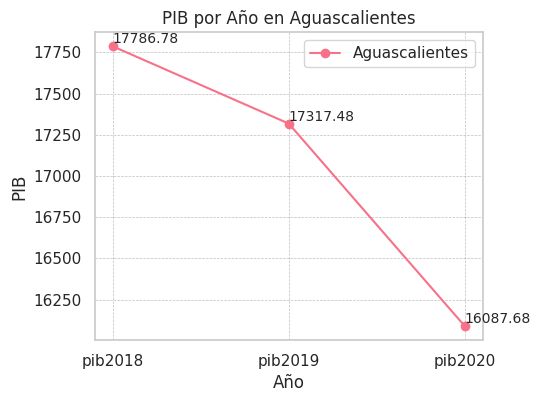

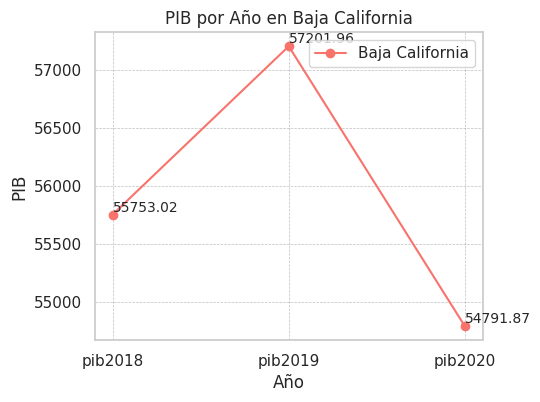

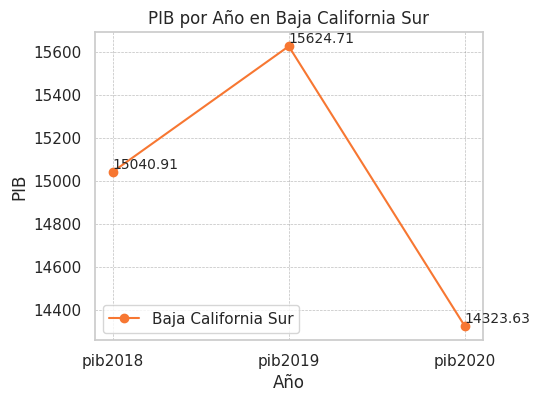

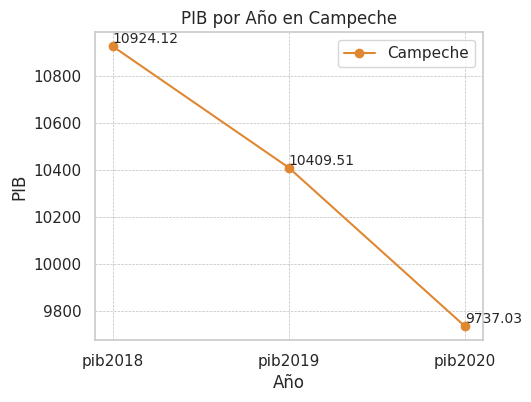

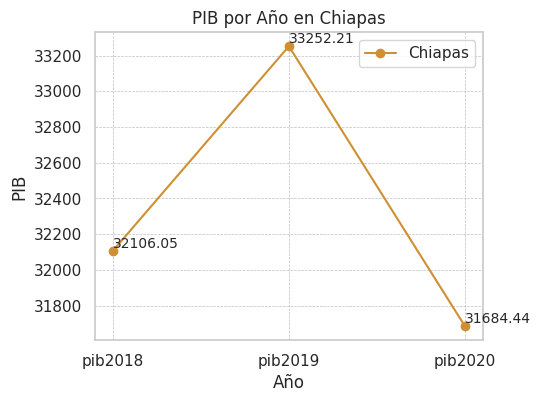

...

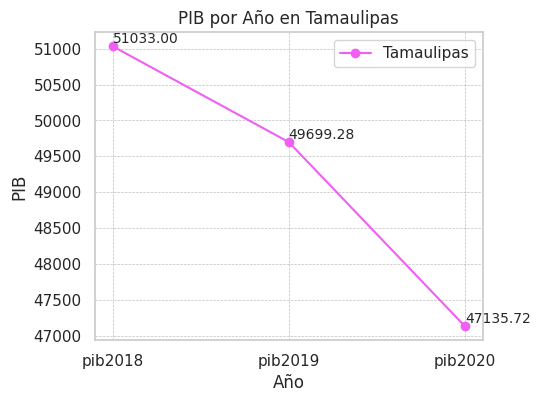

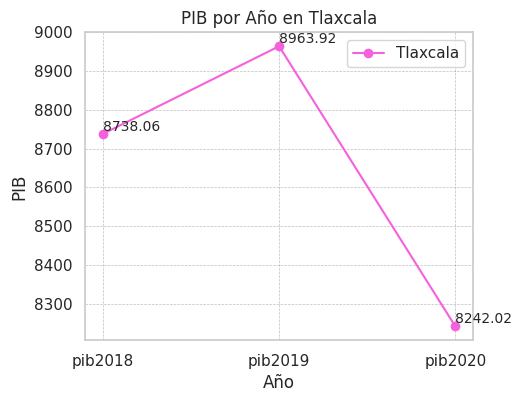

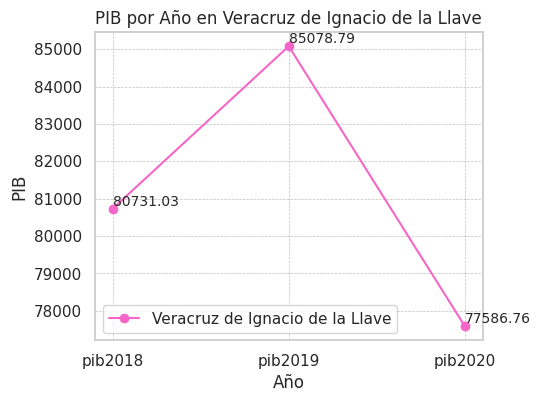

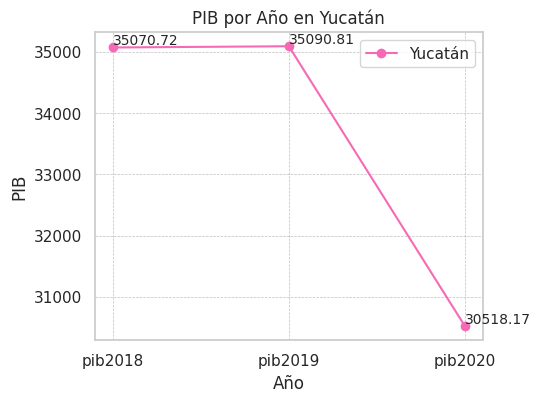

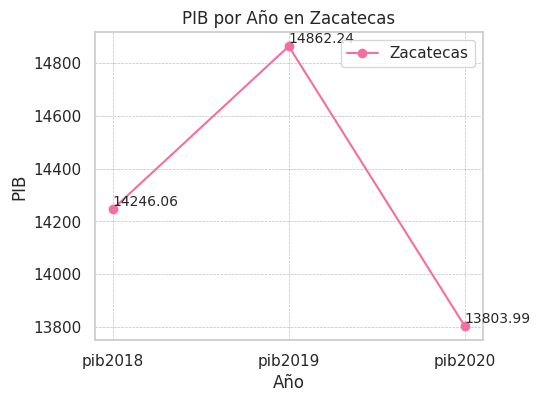

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(style="whitegrid")

entidades_grouped = pib.groupby('Entidad')

colores = sns.color_palette('husl', n_colors=len(entidades_grouped))

for entidad, data_entidad in entidades_grouped:
    plt.figure(figsize=(5, 4))
    years = pib.columns[1:]
    plt.plot(years, data_entidad.iloc[:, 1:].values.flatten(), marker='o', label=entidad, color=colores.pop(0))

    for i, value in enumerate(data_entidad.iloc[:, 1:].values.flatten()):
        plt.text(years[i], value, f'{value:.2f}', ha='left', va='bottom', fontsize=10)

    plt.title(f'PIB por Año en {entidad}')
    plt.xlabel('Año')
    plt.ylabel('PIB')
    plt.legend()
    plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
    plt.show()


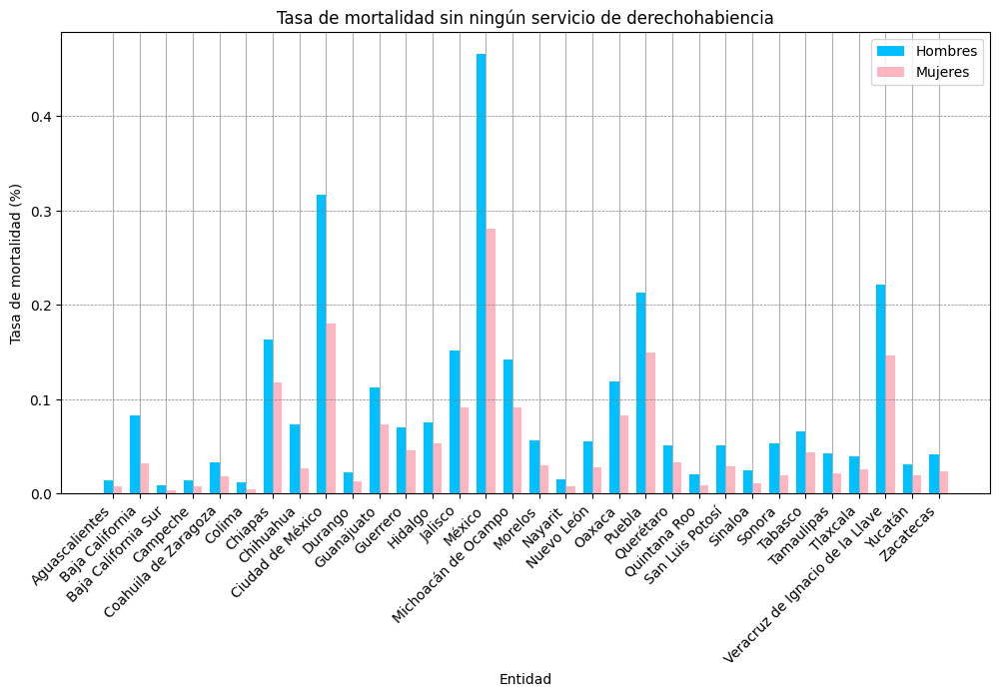

In [22]:
# Calcular la tasa de mortalidad por entidad
mort_ninguna['tasa_mortalidad_hombre'] = mort_ninguna['hombre'] / pob_general['hombre'].sum() * 1000
mort_ninguna['tasa_mortalidad_mujer'] = mort_ninguna['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_ninguna['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_ninguna['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_ninguna['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad sin ningún servicio de derechohabiencia')
plt.legend()
plt.xticks(index + bar_width / 2, mort_ninguna['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()


In [ ]:
mort_ninguna['ninguna'] = (mort_ninguna['hombre']+mort_ninguna['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000

In [ ]:
mort_IMSS['IMSS'] = (mort_IMSS['hombre']+mort_IMSS['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000
mort_ISSTE['ISSTE'] = (mort_ISSTE['hombre']+mort_ISSTE['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000
mort_PEMEX['PEMEX'] = (mort_PEMEX['hombre']+mort_PEMEX['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000
mort_SEDENA['SEDENA'] = (mort_SEDENA['hombre']+mort_SEDENA['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000
mort_SEMAR['SEMAR'] = (mort_SEMAR['hombre']+mort_SEMAR['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000
mort_SP_INSABI['SP_INSABI'] = (mort_SP_INSABI['hombre']+mort_SP_INSABI['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000

In [ ]:
mort_otra['OTRA'] = (mort_otra['hombre']+mort_otra['mujer']) / (pob_general['hombre']+pob_general['mujer']).sum() * 1000

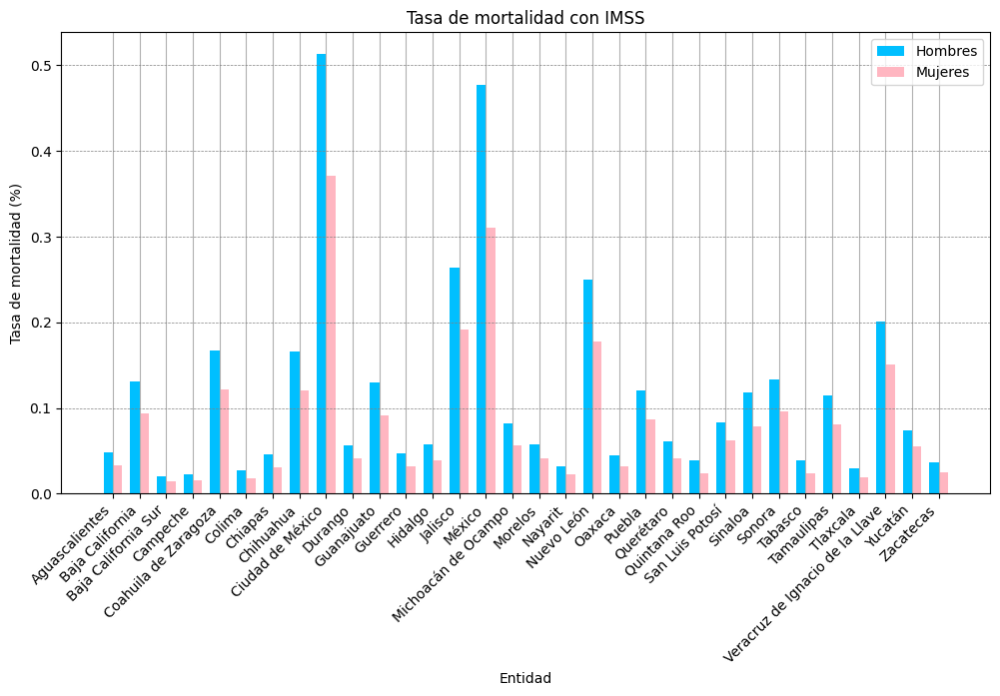

In [27]:
# Calcular la tasa de mortalidad por entidad
mort_IMSS['tasa_mortalidad_hombre'] = mort_IMSS['hombre'] / pob_general['hombre'].sum() * 1000
mort_IMSS['tasa_mortalidad_mujer'] = mort_IMSS['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_IMSS['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_IMSS['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_IMSS['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad con IMSS')
plt.legend()
plt.xticks(index + bar_width / 2, mort_IMSS['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()


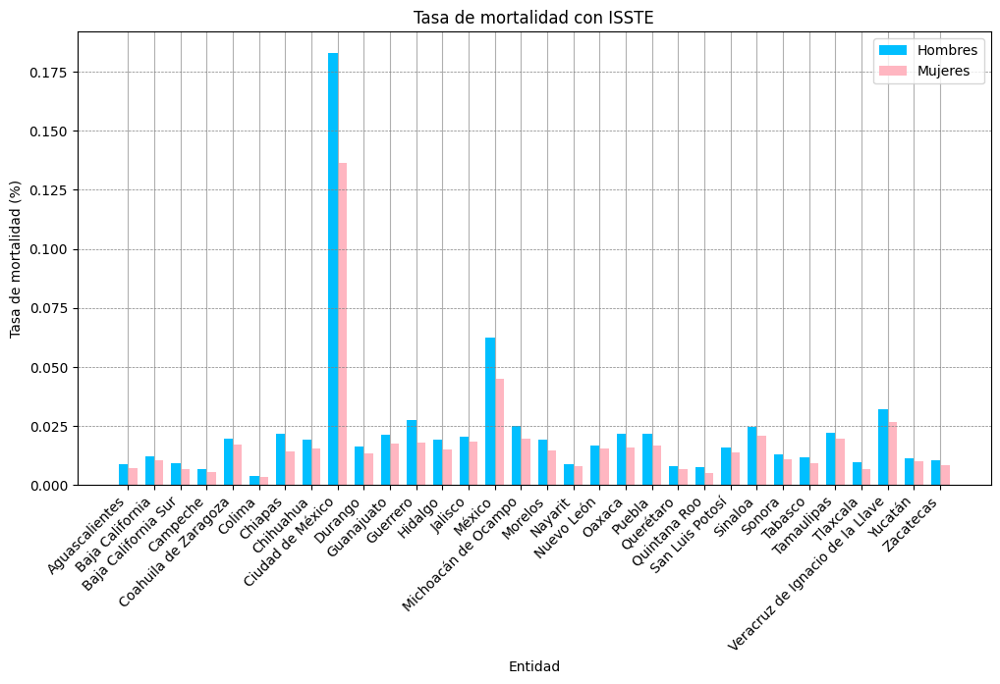

In [28]:
# Calcular la tasa de mortalidad por entidad
mort_ISSTE['tasa_mortalidad_hombre'] = mort_ISSTE['hombre'] / pob_general['hombre'].sum() * 1000
mort_ISSTE['tasa_mortalidad_mujer'] = mort_ISSTE['mujer'] / pob_general['mujer'].sum() * 1000
# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_ISSTE['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_ISSTE['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_ISSTE['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad con ISSTE')
plt.legend()
plt.xticks(index + bar_width / 2, mort_ISSTE['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()


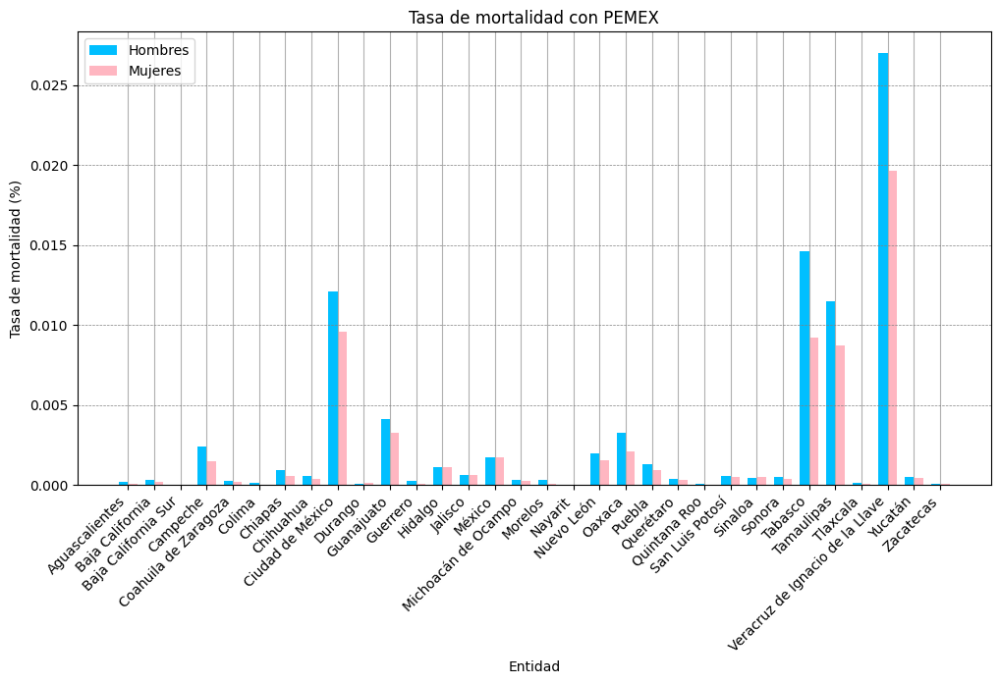

In [29]:
# Calcular la tasa de mortalidad por entidad
mort_PEMEX['tasa_mortalidad_hombre'] = mort_PEMEX['hombre'] / pob_general['hombre'].sum() * 1000
mort_PEMEX['tasa_mortalidad_mujer'] = mort_PEMEX['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_PEMEX['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_PEMEX['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_PEMEX['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad con PEMEX')
plt.legend()
plt.xticks(index + bar_width / 2, mort_PEMEX['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()


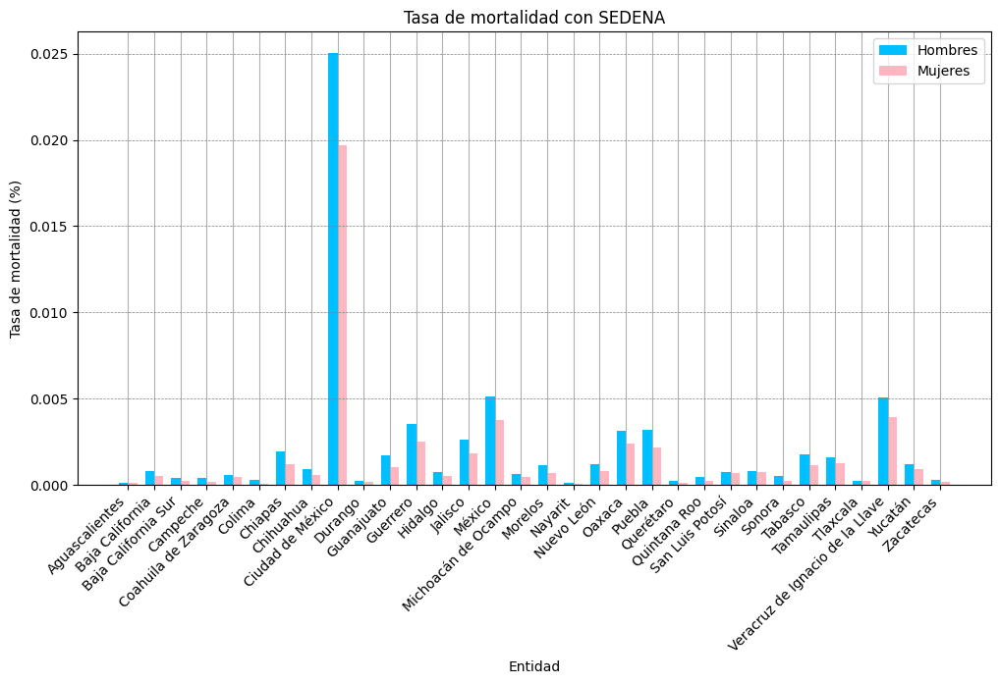

In [30]:
# Calcular la tasa de mortalidad por entidad
mort_SEDENA['tasa_mortalidad_hombre'] = mort_SEDENA['hombre'] / pob_general['hombre'].sum() * 1000
mort_SEDENA['tasa_mortalidad_mujer'] = mort_SEDENA['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_SEDENA['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_SEDENA['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_SEDENA['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad con SEDENA')
plt.legend()
plt.xticks(index + bar_width / 2, mort_SEDENA['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()

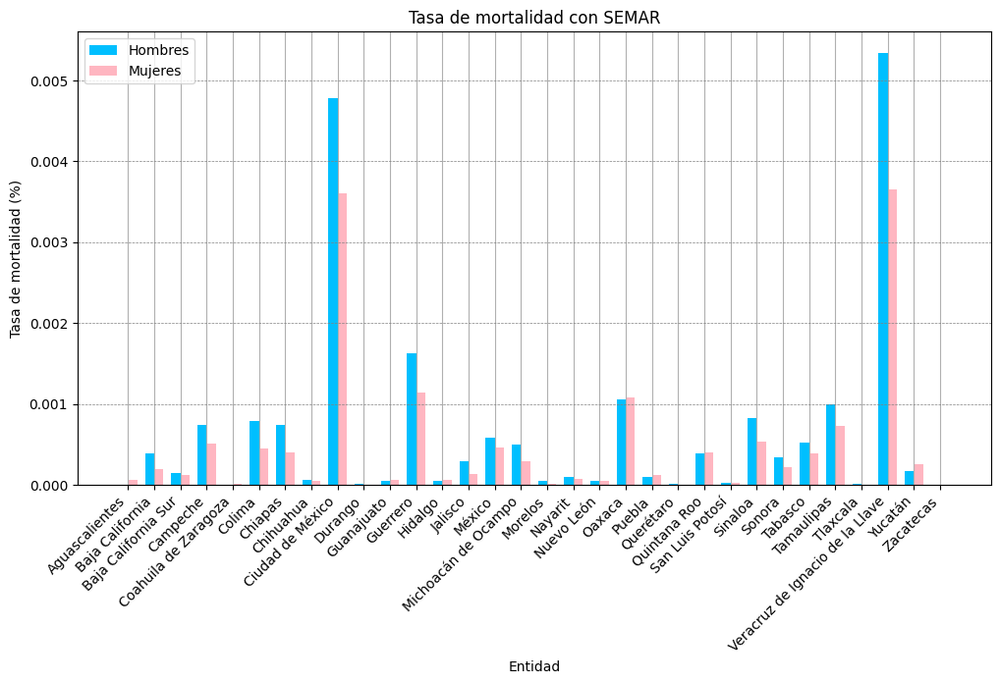

In [31]:
# Calcular la tasa de mortalidad por entidad
mort_SEMAR['tasa_mortalidad_hombre'] = mort_SEMAR['hombre'] / pob_general['hombre'].sum() * 1000
mort_SEMAR['tasa_mortalidad_mujer'] = mort_SEMAR['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_SEMAR['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_SEMAR['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_SEMAR['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad con SEMAR')
plt.legend()
plt.xticks(index + bar_width / 2, mort_SEMAR['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()

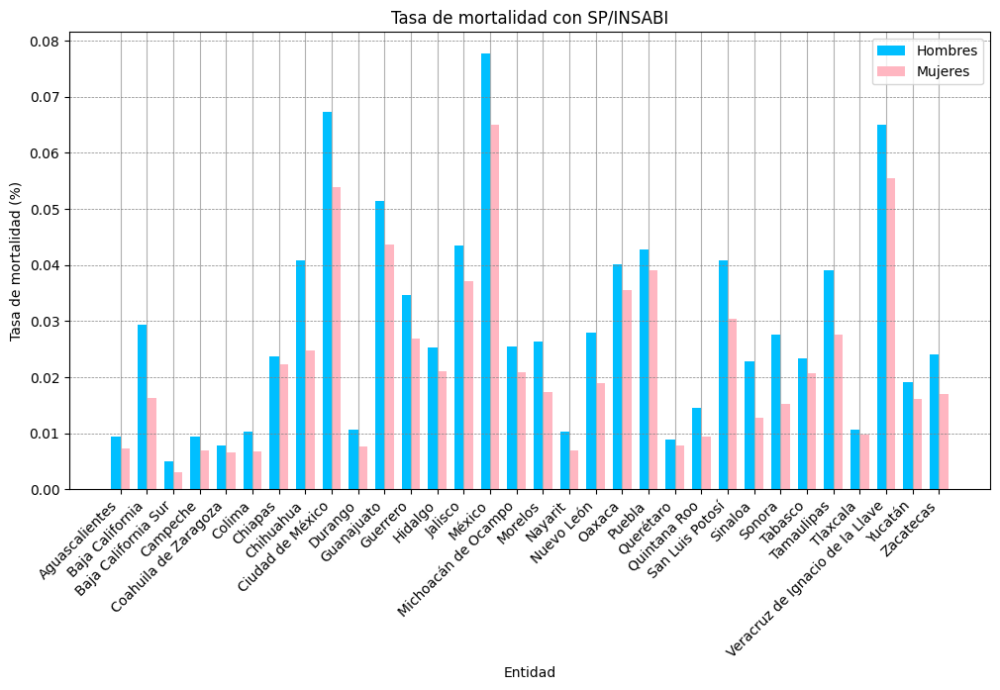

In [33]:
# Calcular la tasa de mortalidad por entidad
mort_SP_INSABI['tasa_mortalidad_hombre'] = mort_SP_INSABI['hombre'] / pob_general['hombre'].sum() * 1000
mort_SP_INSABI['tasa_mortalidad_mujer'] = mort_SP_INSABI['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_SP_INSABI['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_SP_INSABI['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_SP_INSABI['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad con SP/INSABI')
plt.legend()
plt.xticks(index + bar_width / 2, mort_SP_INSABI['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()

In [1]:
# Calcular la tasa de mortalidad por entidad
mort_otra['tasa_mortalidad_hombre'] = mort_otra['hombre'] / pob_general['hombre'].sum() * 1000
mort_otra['tasa_mortalidad_mujer'] = mort_otra['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_otra['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_otra['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_otra['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad con otra cobertura')
plt.legend()
plt.xticks(index + bar_width / 2, mort_otra['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()

NameError: ignored

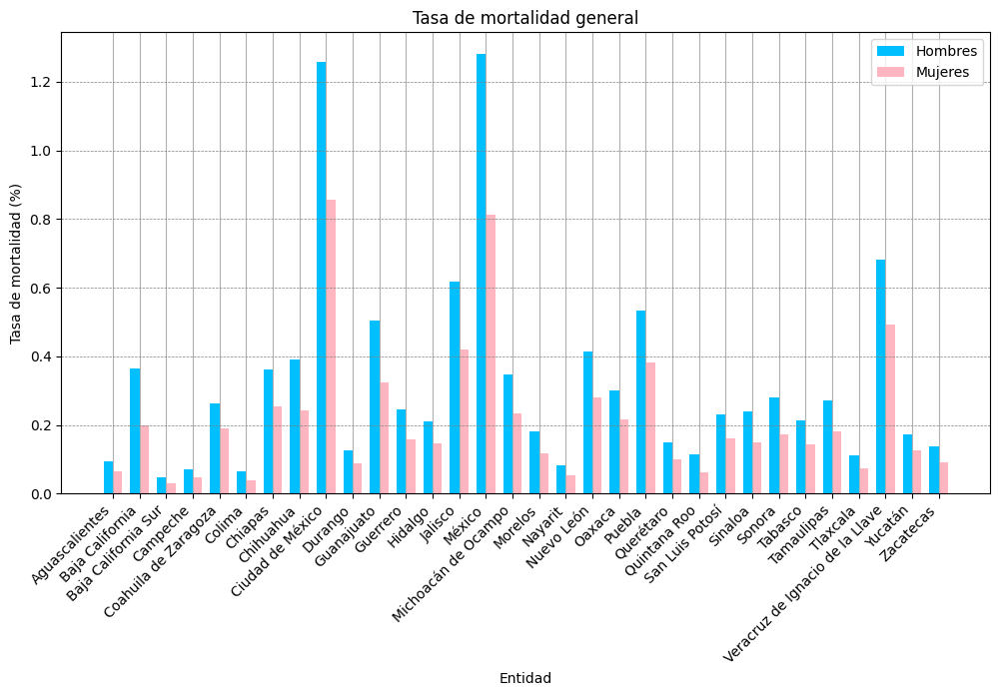

In [35]:
# Calcular la tasa de mortalidad por entidad
mort_general['tasa_mortalidad_hombre'] = mort_general['hombre'] / pob_general['hombre'].sum() * 1000
mort_general['tasa_mortalidad_mujer'] = mort_general['mujer'] / pob_general['mujer'].sum() * 1000

# Definir el ancho de las barras y las posiciones de los ejes x
bar_width = 0.35
index = np.arange(len(mort_general['entidad']))

# Graficar las tasas de mortalidad por entidad
plt.figure(figsize=(12, 6))

# Agregar cuadrícula
plt.grid(which='major', axis='y', linestyle='--', linewidth=0.5, color='gray')

# Cambiar los colores de las barras
plt.bar(index, mort_general['tasa_mortalidad_hombre'], label='Hombres', color='deepskyblue', width=bar_width)
plt.bar(index + bar_width, mort_general['tasa_mortalidad_mujer'], label='Mujeres', color='lightpink', width=bar_width)

# Otros ajustes
plt.xlabel('Entidad')
plt.ylabel('Tasa de mortalidad (%)')
plt.title('Tasa de mortalidad general')
plt.legend()
plt.xticks(index + bar_width / 2, mort_general['entidad'], rotation=45, ha='right')
plt.grid(True)
plt.show()

In [ ]:
mort_general.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre,tasa_mortalidad_mujer,mortalidad_general
0,1,Aguascalientes,5803,4163,0.094399,0.064502,0.079086
1,2,Baja California,22328,12777,0.363214,0.197968,0.278580
2,3,Baja California Sur,2965,1947,0.048232,0.030167,0.038980
3,4,Campeche,4342,3030,0.070632,0.046947,0.058501
4,5,Coahuila de Zaragoza,16105,12178,0.261983,0.188687,0.224443


In [ ]:
mort_general['mortalidad_general'] = (mort_general['hombre'] + mort_general['mujer'])/(pob_general['hombre']+pob_general['mujer']).sum() * 1000

# Mostrar el DataFrame con la nueva columna
mort_general.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre,tasa_mortalidad_mujer,mortalidad_general
0,1,Aguascalientes,5803,4163,0.094399,0.064502,0.079086
1,2,Baja California,22328,12777,0.363214,0.197968,0.278580
2,3,Baja California Sur,2965,1947,0.048232,0.030167,0.038980
3,4,Campeche,4342,3030,0.070632,0.046947,0.058501
4,5,Coahuila de Zaragoza,16105,12178,0.261983,0.188687,0.224443


In [ ]:
tasas=pd.concat([mort_general,mort_IMSS,mort_ISSTE,mort_PEMEX,mort_SEDENA,mort_SEMAR,mort_SP_INSABI,mort_ninguna,mort_otra], axis=1)
tasas

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre,tasa_mortalidad_mujer,mortalidad_general,clave_ent,entidad,hombre,...,tasa_mortalidad_hombre,tasa_mortalidad_mujer,ninguna,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_otra,tasa_mortalidad_mujer_otra,OTRA
0,1,Aguascalientes,5803,4163,0.094399,0.064502,0.079086,1,Aguascalientes,2932,...,0.014462,0.007670,0.010983,1,Aguascalientes,60,34,0.000976,0.000527,0.000746
1,2,Baja California,22328,12777,0.363214,0.197968,0.278580,2,Baja California,8080,...,0.082621,0.031949,0.056668,2,Baja California,1123,896,0.018268,0.013883,0.016022
2,3,Baja California Sur,2965,1947,0.048232,0.030167,0.038980,3,Baja California Sur,1221,...,0.008378,0.003517,0.005888,3,Baja California Sur,17,14,0.000277,0.000217,0.000246
3,4,Campeche,4342,3030,0.070632,0.046947,0.058501,4,Campeche,1400,...,0.013730,0.008150,0.010872,4,Campeche,119,59,0.001936,0.000914,0.001413
4,5,Coahuila de Zaragoza,16105,12178,0.261983,0.188687,0.224443,5,Coahuila de Zaragoza,10235,...,0.032957,0.017849,0.025219,5,Coahuila de Zaragoza,191,174,0.003107,0.002696,0.002897
5,6,Colima,3921,2473,0.063784,0.038317,0.050740,6,Colima,1689,...,0.012444,0.004757,0.008507,6,Colima,72,55,0.001171,0.000852,0.001008
6,7,Chiapas,22235,16324,0.361701,0.252926,0.305990,7,Chiapas,2846,...,0.162981,0.117616,0.139746,7,Chiapas,554,418,0.009012,0.006477,0.007713
7,8,Chihuahua,24022,15599,0.390771,0.241693,0.314417,8,Chihuahua,10205,...,0.073625,0.027130,0.049812,8,Chihuahua,1243,1119,0.020220,0.017338,0.018744
8,9,Ciudad de México,77311,55172,1.257634,0.854841,1.051335,9,Ciudad de México,31533,...,0.316983,0.180460,0.247060,9,Ciudad de México,1808,1270,0.029411,0.019678,0.024426
9,10,Durango,7757,5739,0.126185,0.088921,0.107099,10,Durango,3449,...,0.023018,0.013340,0.018061,10,Durango,71,44,0.001155,0.000682,0.000913


In [ ]:
columnas = ['mortalidad_general', 'IMSS', 'ISSTE', 'PEMEX', 'SEDENA','SEMAR','SP_INSABI' ,'OTRA','ninguna']

In [ ]:
tasas = tasas[columnas]

In [ ]:
tasas.head()

,mortalidad_general,IMSS,ISSTE,PEMEX,SEDENA,SEMAR,SP_INSABI,OTRA,ninguna
0,0.079086,0.039972,0.007967,0.000143,0.000127,0.000032,0.008340,0.000746,0.010983
1,0.278580,0.112178,0.011213,0.000246,0.000675,0.000294,0.022640,0.016022,0.056668
2,0.038980,0.017070,0.007991,0.000016,0.000333,0.000135,0.004007,0.000246,0.005888
3,0.058501,0.019157,0.006095,0.001944,0.000286,0.000627,0.008078,0.001413,0.010872
4,0.224443,0.143778,0.018490,0.000246,0.000516,0.000008,0.007198,0.002897,0.025219


In [ ]:
tasas['Entidad'] = derechohabiencia_general['entidad']

<ipython-input-87-ed2b84ff04d9>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  tasas['Entidad'] = derechohabiencia_general['entidad']


In [ ]:
tasas.head()

,mortalidad_general,IMSS,ISSTE,PEMEX,SEDENA,SEMAR,SP_INSABI,OTRA,ninguna,Entidad
0,0.079086,0.039972,0.007967,0.000143,0.000127,0.000032,0.008340,0.000746,0.010983,Estados Unidos Mexicanos
1,0.278580,0.112178,0.011213,0.000246,0.000675,0.000294,0.022640,0.016022,0.056668,Aguascalientes
2,0.038980,0.017070,0.007991,0.000016,0.000333,0.000135,0.004007,0.000246,0.005888,Baja California
3,0.058501,0.019157,0.006095,0.001944,0.000286,0.000627,0.008078,0.001413,0.010872,Baja California Sur
4,0.224443,0.143778,0.018490,0.000246,0.000516,0.000008,0.007198,0.002897,0.025219,Campeche


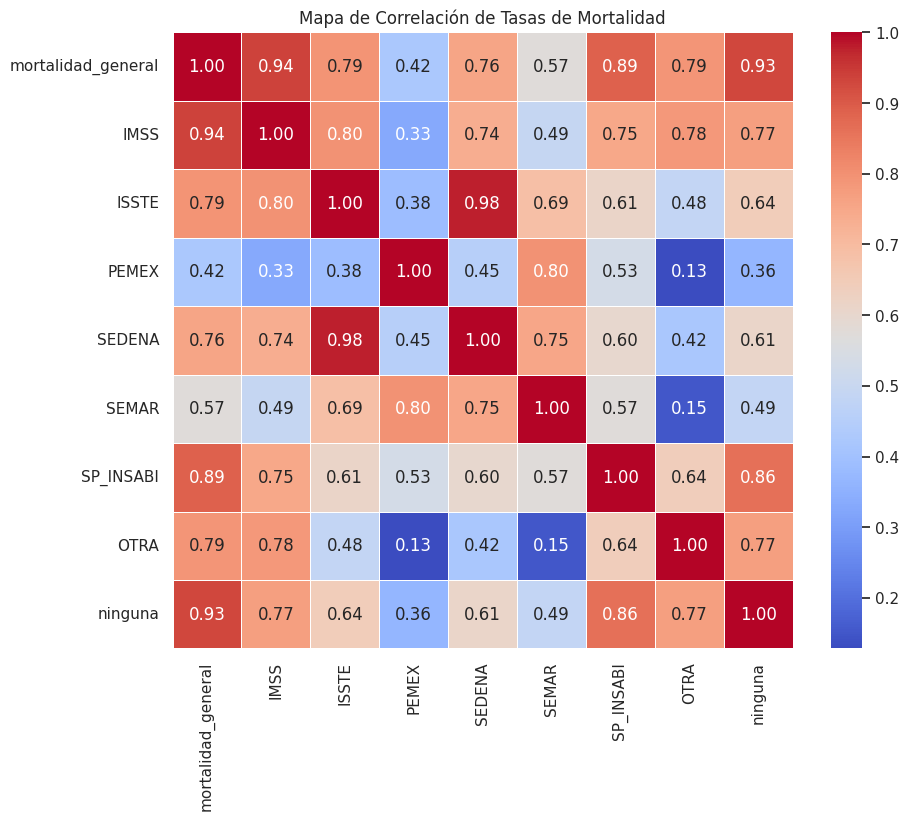

In [ ]:
# Seleccionar solo las columnas numéricas para calcular la matriz de correlación
columnas_numericas = tasas.select_dtypes(include=['float64', 'int64']).columns
matriz_correlacion = tasas[columnas_numericas].corr()

# Crear un mapa de calor con seaborn
plt.figure(figsize=(10, 8))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)

# Configuración del gráfico
plt.title('Mapa de Correlación de Tasas de Mortalidad')
plt.show()

In [ ]:
esp_vida_2018.head()

,entidad,total,hombres,mujeres
0,Estados Unidos Mexicanos,74.9,71.8,78.0
1,Aguascalientes,76.6,73.5,79.7
2,Baja California,76.2,73.3,79.3
3,Baja California Sur,76.8,73.9,80.0
4,Campeche,74.1,71.0,77.4


In [ ]:
esp_vida_2018 = esp_vida_2018.rename(columns={
    'total': 'Total2018',
    'hombres': 'Hombres2018',
    'mujeres': 'Mujeres2018','entidad':'Entidad'
})

In [ ]:
esp_vida_2019 = esp_vida_2019.rename(columns={
    'Total': 'Total2019',
    'Hombres': 'Hombres2019',
    'Mujeres': 'Mujeres2019'
})

In [ ]:
esp_vida_2020 = esp_vida_2020.rename(columns={
    'Total': 'Total2020',
    'Hombres': 'Hombres2020',
    'Mujeres': 'Mujeres2020'
})

In [ ]:
esperanzas=pd.concat([esp_vida_2018, esp_vida_2019,esp_vida_2020], axis=1)
esperanzas

,Entidad,Total2018,Hombres2018,Mujeres2018,entidad,Total2019,Hombres2019,Mujeres2019,entidad,Total2020,Hombres2020,Mujeres2020
0,Estados Unidos Mexicanos,74.9,71.8,78.0,Estados Unidos Mexicanos,74.8,71.8,78.0,Estados Unidos Mexicanos,68.9,64.8,73.5
1,Aguascalientes,76.6,73.5,79.7,Aguascalientes,76.5,73.4,79.6,Aguascalientes,70.1,65.7,75.2
2,Baja California,76.2,73.3,79.3,Baja California,76.1,73.1,79.3,Baja California,68.9,65.6,72.6
3,Baja California Sur,76.8,73.9,80.0,Baja California Sur,76.7,73.8,79.9,Baja California Sur,72.5,69.7,75.6
4,Campeche,74.1,71.0,77.4,Campeche,74.1,70.9,77.3,Campeche,68.0,64.3,72.1
5,Coahuila de Zaragoza,76.8,73.8,79.9,Coahuila de Zaragoza,76.7,73.7,79.8,Coahuila de Zaragoza,69.9,66.0,74.2
6,Colima,75.8,72.8,79.0,Colima,75.7,72.6,79.0,Colima,72.1,69.1,75.5
7,Chiapas,72.6,69.4,75.8,Chiapas,72.6,69.3,75.8,Chiapas,67.9,63.8,72.6
8,Chihuahua,76.3,73.3,79.4,Chihuahua,76.2,73.2,79.4,Chihuahua,69.5,65.7,73.9
9,Ciudad de México,76.6,73.5,79.6,Ciudad de México,76.5,73.4,79.6,Ciudad de México,69.2,64.5,74.6


In [ ]:
esperanzas = esperanzas.drop('entidad', axis=1)

In [ ]:
esperanzas

,Entidad,Total2018,Hombres2018,Mujeres2018,Total2019,Hombres2019,Mujeres2019,Total2020,Hombres2020,Mujeres2020
0,Estados Unidos Mexicanos,74.9,71.8,78.0,74.8,71.8,78.0,68.9,64.8,73.5
1,Aguascalientes,76.6,73.5,79.7,76.5,73.4,79.6,70.1,65.7,75.2
2,Baja California,76.2,73.3,79.3,76.1,73.1,79.3,68.9,65.6,72.6
3,Baja California Sur,76.8,73.9,80.0,76.7,73.8,79.9,72.5,69.7,75.6
4,Campeche,74.1,71.0,77.4,74.1,70.9,77.3,68.0,64.3,72.1
5,Coahuila de Zaragoza,76.8,73.8,79.9,76.7,73.7,79.8,69.9,66.0,74.2
6,Colima,75.8,72.8,79.0,75.7,72.6,79.0,72.1,69.1,75.5
7,Chiapas,72.6,69.4,75.8,72.6,69.3,75.8,67.9,63.8,72.6
8,Chihuahua,76.3,73.3,79.4,76.2,73.2,79.4,69.5,65.7,73.9
9,Ciudad de México,76.6,73.5,79.6,76.5,73.4,79.6,69.2,64.5,74.6


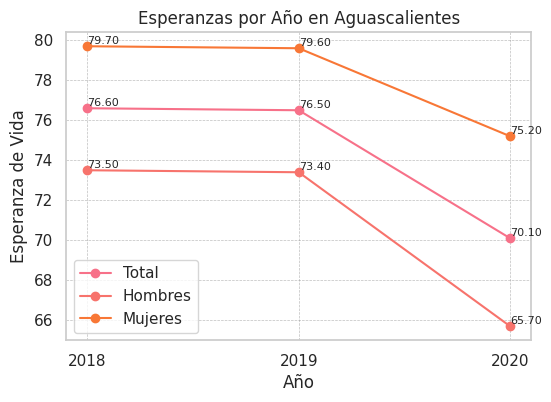

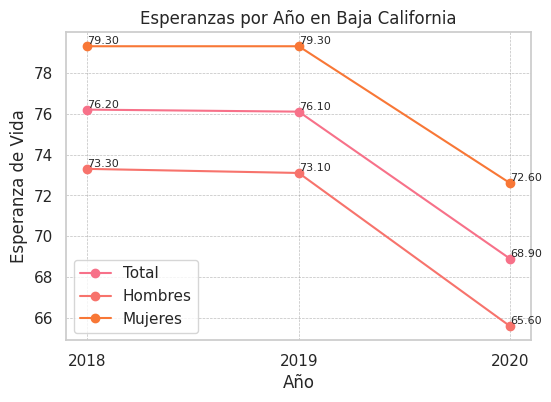

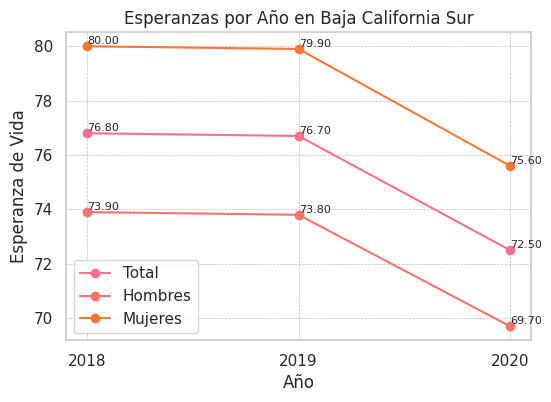

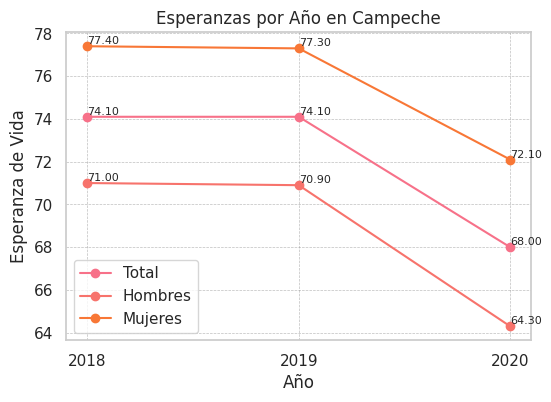

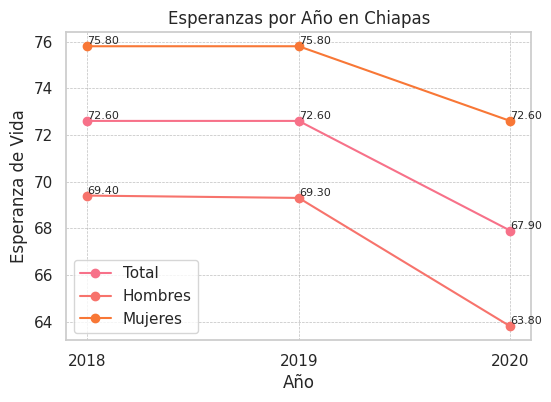

...

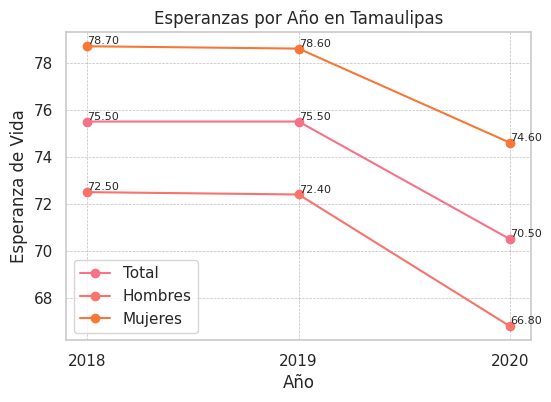

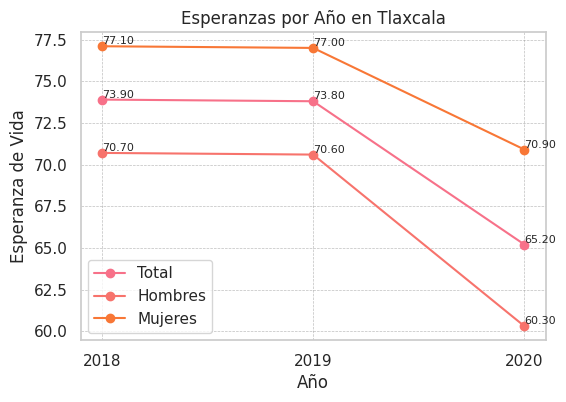

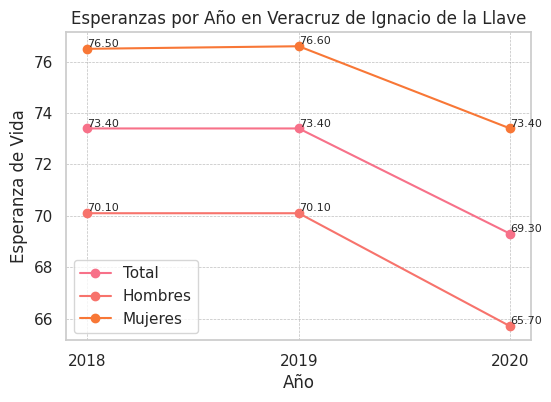

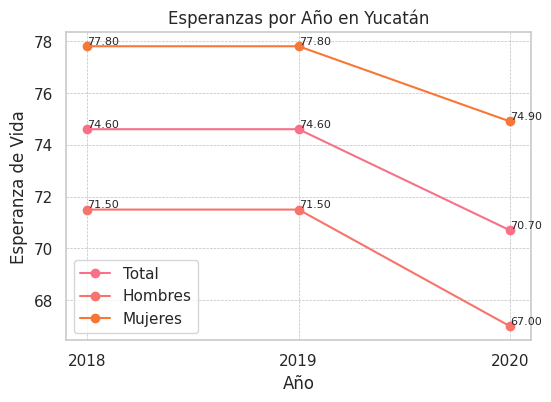

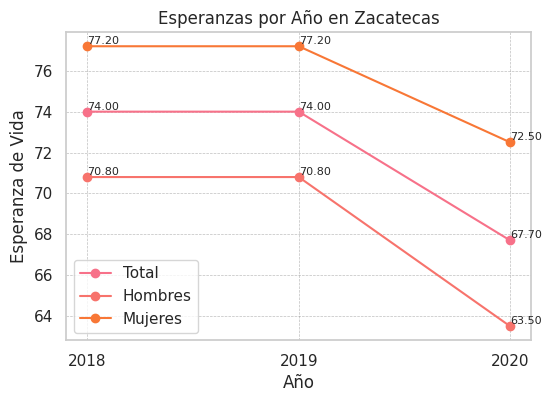

In [ ]:
# Configuración de estilo de seaborn
sns.set(style="whitegrid")

# Agrupa los datos por entidad
entidades_grouped = esperanzas.groupby('Entidad')

# Colores para las líneas
colores = sns.color_palette('husl', n_colors=len(entidades_grouped))

# Itera sobre las entidades y crea un gráfico para cada una
for entidad, data_entidad in entidades_grouped:
    plt.figure(figsize=(6, 4))

    # Esperanza de vida total
    total_values = data_entidad[['Total2018', 'Total2019', 'Total2020']].values.flatten()
    plt.plot(['2018', '2019', '2020'], total_values, marker='o', label='Total', color=colores[0])
    for i, value in enumerate(total_values):
        plt.text(i, value, f'{value:.2f}', ha='left', va='bottom',fontsize=10)

    # Esperanza de vida hombres
    hombres_values = data_entidad[['Hombres2018', 'Hombres2019', 'Hombres2020']].values.flatten()
    plt.plot(['2018', '2019', '2020'], hombres_values, marker='o', label='Hombres', color=colores[1])
    for i, value in enumerate(hombres_values):
        plt.text(i, value, f'{value:.2f}', ha='left', va='bottom',fontsize=10)

    # Esperanza de vida mujeres
    mujeres_values = data_entidad[['Mujeres2018', 'Mujeres2019', 'Mujeres2020']].values.flatten()
    plt.plot(['2018', '2019', '2020'], mujeres_values, marker='o', label='Mujeres', color=colores[2])
    for i, value in enumerate(mujeres_values):
        plt.text(i, value, f'{value:.2f}', ha='left', va='bottom',fontsize=10)

    plt.title(f'Esperanzas por Año en {entidad}')
    plt.xlabel('Año')
    plt.ylabel('Edad')
    plt.legend()
    plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
    plt.show()


In [ ]:
mort_IMSS =mort_IMSS.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_IMSS',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_IMSS',
})
mort_IMSS.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_IMSS,tasa_mortalidad_mujer_IMSS
0,1,Aguascalientes,2932,2105,0.004770,0.003262
1,2,Baja California,8080,6056,0.013144,0.009383
2,3,Baja California Sur,1221,930,0.001986,0.001441
3,4,Campeche,1400,1014,0.002277,0.001571
4,5,Coahuila de Zaragoza,10235,7883,0.016649,0.012214


In [ ]:
mort_ISSTE =mort_ISSTE.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_ISSTE',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_ISSTE',
})
mort_ISSTE.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_ISSTE,tasa_mortalidad_mujer_ISSTE
0,1,Aguascalientes,543,461,0.000883,0.000714
1,2,Baja California,741,672,0.001205,0.001041
2,3,Baja California Sur,557,450,0.000906,0.000697
3,4,Campeche,405,363,0.000659,0.000562
4,5,Coahuila de Zaragoza,1214,1116,0.001975,0.001729


In [ ]:
mort_PEMEX =mort_PEMEX.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_PEMEX',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_PEMEX',
})
mort_PEMEX.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_PEMEX,tasa_mortalidad_mujer_PEMEX
0,1,Aguascalientes,11,7,0.000018,0.000011
1,2,Baja California,19,12,0.000031,0.000019
2,3,Baja California Sur,2,0,0.000003,0.000000
3,4,Campeche,149,96,0.000242,0.000149
4,5,Coahuila de Zaragoza,18,13,0.000029,0.000020


In [ ]:
mort_SEDENA =mort_SEDENA.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_SEDENA',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_SEDENA',
})
mort_SEDENA.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_SEDENA,tasa_mortalidad_mujer_SEDENA
0,1,Aguascalientes,8,8,0.000013,0.000012
1,2,Baja California,50,35,0.000081,0.000054
2,3,Baja California Sur,26,16,0.000042,0.000025
3,4,Campeche,24,12,0.000039,0.000019
4,5,Coahuila de Zaragoza,35,30,0.000057,0.000046


In [ ]:
mort_SEMAR =mort_SEMAR.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_SEMAR',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_SEMAR',
})
mort_SEMAR.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_SEMAR,tasa_mortalidad_mujer_SEMAR
0,1,Aguascalientes,0,4,0.000000,0.000006
1,2,Baja California,24,13,0.000039,0.000020
2,3,Baja California Sur,9,8,0.000015,0.000012
3,4,Campeche,46,33,0.000075,0.000051
4,5,Coahuila de Zaragoza,0,1,0.000000,0.000002


In [ ]:
mort_SP_INSABI =mort_SP_INSABI.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_SP_INSABI',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_SP_INSABI',
})
mort_SP_INSABI.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_SP_INSABI,tasa_mortalidad_mujer_SP_INSABI
0,1,Aguascalientes,575,476,0.000935,0.000738
1,2,Baja California,1802,1051,0.002931,0.001628
2,3,Baja California Sur,309,196,0.000503,0.000304
3,4,Campeche,573,445,0.000932,0.000689
4,5,Coahuila de Zaragoza,481,426,0.000782,0.000660


In [ ]:
mort_ninguna =mort_ninguna.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_ninguna',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_ninguna',
})
mort_ninguna.head()

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_ninguna,tasa_mortalidad_mujer_ninguna
0,1,Aguascalientes,889,495,0.001446,0.000767
1,2,Baja California,5079,2062,0.008262,0.003195
2,3,Baja California Sur,515,227,0.000838,0.000352
3,4,Campeche,844,526,0.001373,0.000815
4,5,Coahuila de Zaragoza,2026,1152,0.003296,0.001785


In [ ]:
mort_otra =mort_otra.rename(columns={
    'tasa_mortalidad_hombre': 'tasa_mortalidad_hombre_otra',
    'tasa_mortalidad_mujer': 'tasa_mortalidad_mujer_otra',
    'entidad':'Entidad'
})
mort_otra.head()

,clave_ent,Entidad,hombre,mujer,tasa_mortalidad_hombre_otra,tasa_mortalidad_mujer_otra
0,1,Aguascalientes,60,34,0.000098,0.000053
1,2,Baja California,1123,896,0.001827,0.001388
2,3,Baja California Sur,17,14,0.000028,0.000022
3,4,Campeche,119,59,0.000194,0.000091
4,5,Coahuila de Zaragoza,191,174,0.000311,0.000270


In [ ]:
esperanzas = esperanzas[esperanzas['Entidad'] != 'Estados Unidos Mexicanos']
esperanzas = esperanzas.reset_index(drop=True)


In [ ]:
todo=pd.concat([mort_ninguna,mort_IMSS,mort_ISSTE,mort_PEMEX,mort_SEDENA,mort_SEMAR,mort_SP_INSABI, mort_general, esperanzas,pib], axis=1)
todo

,clave_ent,entidad,hombre,mujer,tasa_mortalidad_hombre_ninguna,tasa_mortalidad_mujer_ninguna,clave_ent,entidad,hombre,mujer,...,Total2019,Hombres2019,Mujeres2019,Total2020,Hombres2020,Mujeres2020,Entidad,pib2018,pib2019,pib2020
0,1,Aguascalientes,889,495,0.001446,0.000767,1,Aguascalientes,2932,2105,...,76.5,73.4,79.6,70.1,65.7,75.2,Aguascalientes,17786.78,17317.48,16087.68
1,2,Baja California,5079,2062,0.008262,0.003195,2,Baja California,8080,6056,...,76.1,73.1,79.3,68.9,65.6,72.6,Baja California,55753.02,57201.96,54791.87
2,3,Baja California Sur,515,227,0.000838,0.000352,3,Baja California Sur,1221,930,...,76.7,73.8,79.9,72.5,69.7,75.6,Baja California Sur,15040.91,15624.71,14323.63
3,4,Campeche,844,526,0.001373,0.000815,4,Campeche,1400,1014,...,74.1,70.9,77.3,68.0,64.3,72.1,Campeche,10924.12,10409.51,9737.03
4,5,Coahuila de Zaragoza,2026,1152,0.003296,0.001785,5,Coahuila de Zaragoza,10235,7883,...,76.7,73.7,79.8,69.9,66.0,74.2,Coahuila de Zaragoza,41909.00,41702.45,38087.26
5,6,Colima,765,307,0.001244,0.000476,6,Colima,1689,1134,...,75.7,72.6,79.0,72.1,69.1,75.5,Colima,12841.65,12860.31,12427.06
6,7,Chiapas,10019,7591,0.016298,0.011762,7,Chiapas,2846,1984,...,72.6,69.3,75.8,67.9,63.8,72.6,Chiapas,32106.05,33252.21,31684.44
7,8,Chihuahua,4526,1751,0.007363,0.002713,8,Chihuahua,10205,7771,...,76.2,73.2,79.4,69.5,65.7,73.9,Chihuahua,50011.18,49160.44,46030.26
8,9,Ciudad de México,19486,11647,0.031698,0.018046,9,Ciudad de México,31533,23976,...,76.5,73.4,79.6,69.2,64.5,74.6,Ciudad de México,259591.10,259694.19,220952.41
9,10,Durango,1415,861,0.002302,0.001334,10,Durango,3449,2662,...,75.1,72.0,78.3,69.8,66.1,74.0,Durango,17786.02,17902.30,16450.31


In [ ]:
columnas_a_eliminar = ['entidad','Entidad', 'hombre', 'mujer']
todo = todo.drop(columnas_a_eliminar, axis=1)

In [ ]:
todo = todo.loc[:, ~todo.columns.duplicated(keep='first')]

In [ ]:
nombres_columnas = todo.columns
columnas_ordenadas = ['clave_ent'] + [col for col in nombres_columnas if col != 'Entidad']
todo = todo[columnas_ordenadas]


In [ ]:
todo.columns

Index(['clave_ent', 'clave_ent', 'tasa_mortalidad_hombre_ninguna',
       'tasa_mortalidad_mujer_ninguna', 'tasa_mortalidad_hombre_IMSS',
       'tasa_mortalidad_mujer_IMSS', 'tasa_mortalidad_hombre_ISSTE',
       'tasa_mortalidad_mujer_ISSTE', 'tasa_mortalidad_hombre_PEMEX',
       'tasa_mortalidad_mujer_PEMEX', 'tasa_mortalidad_hombre_SEDENA',
       'tasa_mortalidad_mujer_SEDENA', 'tasa_mortalidad_hombre_SEMAR',
       'tasa_mortalidad_mujer_SEMAR', 'tasa_mortalidad_hombre_SP_INSABI',
       'tasa_mortalidad_mujer_SP_INSABI', 'tasa_mortalidad_hombre',
       'tasa_mortalidad_mujer', 'tasa_mortalidad_general', 'Total2018',
       'Hombres2018', 'Mujeres2018', 'Total2019', 'Hombres2019', 'Mujeres2019',
       'Total2020', 'Hombres2020', 'Mujeres2020', 'pib2018', 'pib2019',
       'pib2020'],
      dtype='object')

In [ ]:
todo=todo.drop('clave_ent',axis=1)

In [ ]:

todo['clave_ent'] = range(1, 33)
columnas_a_eliminar = ['Total2019','Total2018', 'Hombres2019', 'Mujeres2019','Hombres2018', 'Mujeres2018','pib2018','pib2019']
todo = todo.drop(columnas_a_eliminar, axis=1)
todo

<ipython-input-198-f3553ddb4758>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  todo['clave_ent'] = range(1, 33)


,clave_ent,tasa_mortalidad_hombre_ninguna,tasa_mortalidad_mujer_ninguna,tasa_mortalidad_hombre_IMSS,tasa_mortalidad_mujer_IMSS,tasa_mortalidad_hombre_ISSTE,tasa_mortalidad_mujer_ISSTE,tasa_mortalidad_hombre_PEMEX,tasa_mortalidad_mujer_PEMEX,tasa_mortalidad_hombre_SEDENA,...,tasa_mortalidad_hombre_SP_INSABI,tasa_mortalidad_mujer_SP_INSABI,tasa_mortalidad_hombre,tasa_mortalidad_mujer,tasa_mortalidad_general,Total2020,Hombres2020,Mujeres2020,pib2020,clave_ent
0,1,0.001446,0.000767,0.004770,0.003262,0.000883,0.000714,0.000018,0.000011,0.000013,...,0.000935,0.000738,0.009440,0.006450,0.015890,70.1,65.7,75.2,16087.68,1
1,2,0.008262,0.003195,0.013144,0.009383,0.001205,0.001041,0.000031,0.000019,0.000081,...,0.002931,0.001628,0.036321,0.019797,0.056118,68.9,65.6,72.6,54791.87,2
2,3,0.000838,0.000352,0.001986,0.001441,0.000906,0.000697,0.000003,0.000000,0.000042,...,0.000503,0.000304,0.004823,0.003017,0.007840,72.5,69.7,75.6,14323.63,3
3,4,0.001373,0.000815,0.002277,0.001571,0.000659,0.000562,0.000242,0.000149,0.000039,...,0.000932,0.000689,0.007063,0.004695,0.011758,68.0,64.3,72.1,9737.03,4
4,5,0.003296,0.001785,0.016649,0.012214,0.001975,0.001729,0.000029,0.000020,0.000057,...,0.000782,0.000660,0.026198,0.018869,0.045067,69.9,66.0,74.2,38087.26,5
5,6,0.001244,0.000476,0.002748,0.001757,0.000387,0.000361,0.000013,0.000002,0.000031,...,0.001026,0.000676,0.006378,0.003832,0.010210,72.1,69.1,75.5,12427.06,6
6,7,0.016298,0.011762,0.004630,0.003074,0.002154,0.001422,0.000091,0.000057,0.000197,...,0.002364,0.002225,0.036170,0.025293,0.061463,67.9,63.8,72.6,31684.44,7
7,8,0.007363,0.002713,0.016601,0.012040,0.001929,0.001559,0.000059,0.000040,0.000094,...,0.004083,0.002479,0.039077,0.024169,0.063246,69.5,65.7,73.9,46030.26,8
8,9,0.031698,0.018046,0.051295,0.037149,0.018284,0.013653,0.001210,0.000961,0.002502,...,0.006730,0.005394,0.125763,0.085484,0.211247,69.2,64.5,74.6,220952.41,9
9,10,0.002302,0.001334,0.005611,0.004125,0.001643,0.001334,0.000010,0.000012,0.000026,...,0.001064,0.000765,0.012618,0.008892,0.021511,69.8,66.1,74.0,16450.31,10


In [ ]:
todo.columns

Index(['clave_ent', 'tasa_mortalidad_hombre_ninguna',
       'tasa_mortalidad_mujer_ninguna', 'tasa_mortalidad_hombre_IMSS',
       'tasa_mortalidad_mujer_IMSS', 'tasa_mortalidad_hombre_ISSTE',
       'tasa_mortalidad_mujer_ISSTE', 'tasa_mortalidad_hombre_PEMEX',
       'tasa_mortalidad_mujer_PEMEX', 'tasa_mortalidad_hombre_SEDENA',
       'tasa_mortalidad_mujer_SEDENA', 'tasa_mortalidad_hombre_SEMAR',
       'tasa_mortalidad_mujer_SEMAR', 'tasa_mortalidad_hombre_SP_INSABI',
       'tasa_mortalidad_mujer_SP_INSABI', 'tasa_mortalidad_hombre',
       'tasa_mortalidad_mujer', 'tasa_mortalidad_general', 'Total2020',
       'Hombres2020', 'Mujeres2020', 'pib2020', 'clave_ent'],
      dtype='object')

In [ ]:
pob_general


,clave_ent,entidad,hombre,mujer
0,1,Aguascalientes,696683,728924
1,2,Baja California,1900589,1868431
2,3,Baja California Sur,405879,392568
3,4,Campeche,456939,471424
4,5,Coahuila de Zaragoza,1563669,1583102
5,6,Colima,360622,370769
6,7,Chiapas,2705947,2837881
7,8,Chihuahua,1853822,1888047
8,9,Ciudad de México,4404927,4805017
9,10,Durango,904866,927784


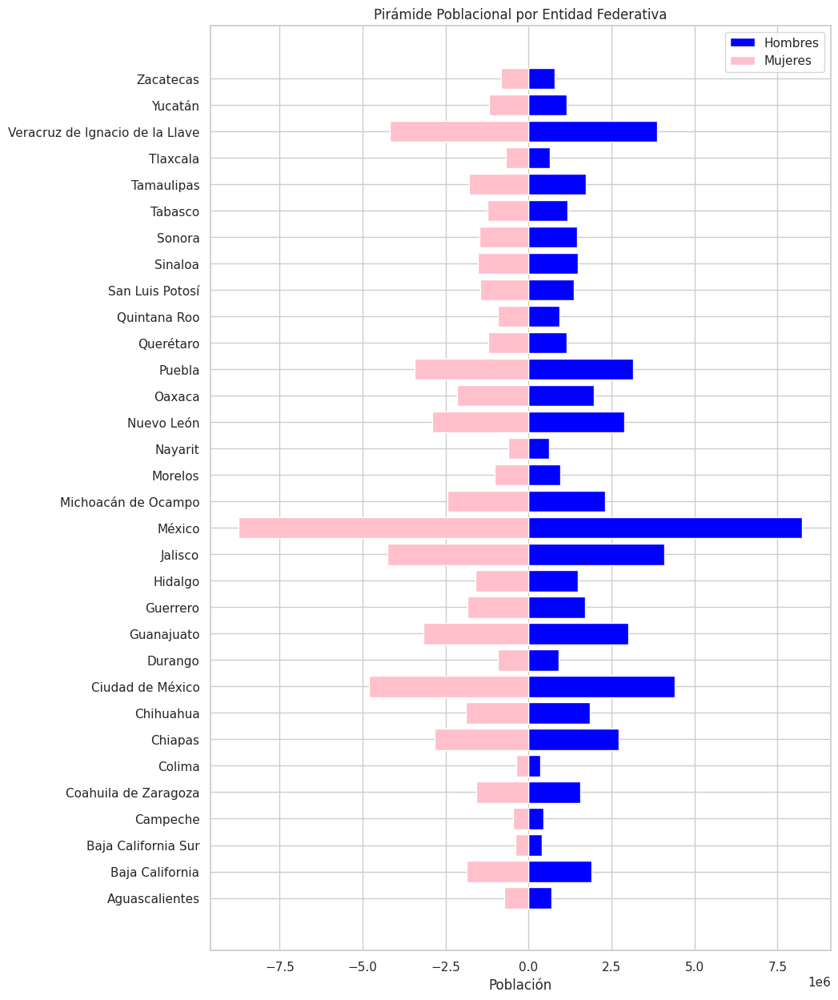

In [ ]:
fig, ax = plt.subplots(figsize=(10, 15))

# Crear barras para hombres y mujeres
ax.barh(pob_general['entidad'], pob_general['hombre'], color='blue', label='Hombres')
ax.barh(pob_general['entidad'], -pob_general['mujer'], color='pink', label='Mujeres')

# Configuraciones adicionales
ax.set_xlabel('Población')
ax.set_title('Pirámide Poblacional por Entidad Federativa')
ax.legend()

# Mostrar la pirámide poblacional
plt.show()

In [ ]:
uploaded = files.upload()


Saving Distribucion-de-Unidades-economicas-segun-entidades-federativas-2019.csv to Distribucion-de-Unidades-economicas-segun-entidades-federativas-2019.csv


In [ ]:
pob_estado = pd.read_csv(io.BytesIO(uploaded["pob_estado (2).csv"]), sep=',', decimal='.')
pob_estado.shape

(2757, 4)

In [ ]:
pob_estado.isna().sum()

Entidad    5
Edad       5
Hombres    5
Mujeres    5
dtype: int64

In [ ]:
pob_estado.fillna(0, inplace=True)

In [ ]:
pob_estado.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2757 entries, 0 to 2756
Data columns (total 4 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Entidad  2757 non-null   object
 1   hombres  2757 non-null   int64 
 2   mujeres  2757 non-null   int64 
 3   edad     2757 non-null   int64 
dtypes: int64(3), object(1)
memory usage: 86.3+ KB


In [ ]:
pob_estado['hombres'] = pob_estado['Hombres'].astype(int)
pob_estado['mujeres'] = pob_estado['Mujeres'].astype(int)
pob_estado['edad'] = pob_estado['Edad'].astype(int)

In [ ]:
columnas_a_eliminar = ['Edad', 'Hombres', 'Mujeres']
pob_estado = pob_estado.drop(columnas_a_eliminar, axis=1)

In [ ]:
pob_estado = pob_estado.iloc[:-5]
print(pob_estado)

             Entidad  hombres  mujeres  edad
0     Aguascalientes    11412    10893     0
1     Aguascalientes    11878    11882     1
2     Aguascalientes    12970    12829     2
3     Aguascalientes    13406    13011     3
4     Aguascalientes    13312    12837     4
...              ...      ...      ...   ...
2747       Zacatecas     1424     1448    81
2748       Zacatecas     1678     1813    82
2749       Zacatecas     1595     1747    83
2750       Zacatecas     1564     1780    84
2751       Zacatecas     8233     9273    85

[2752 rows x 4 columns]


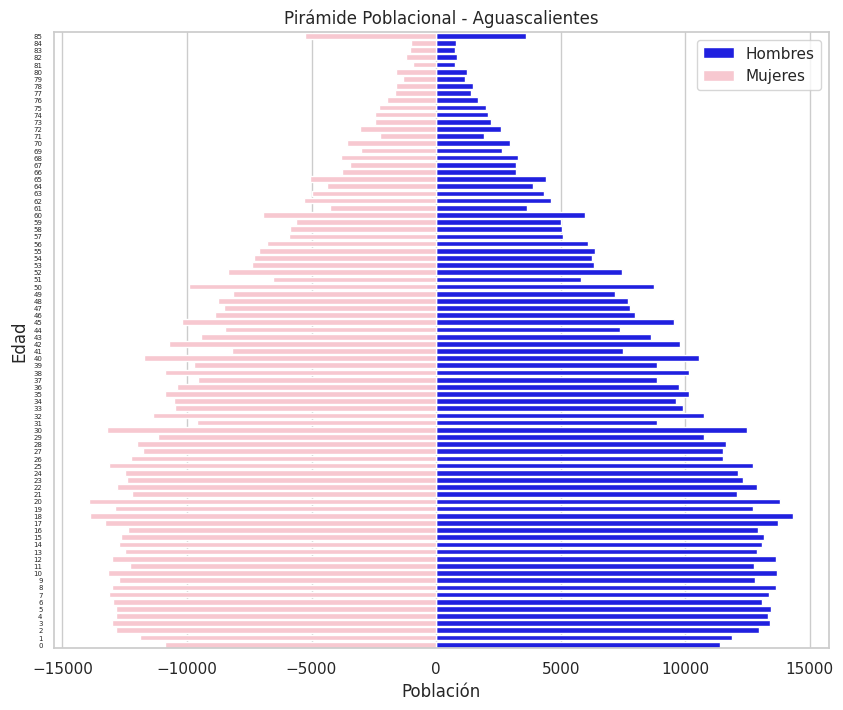

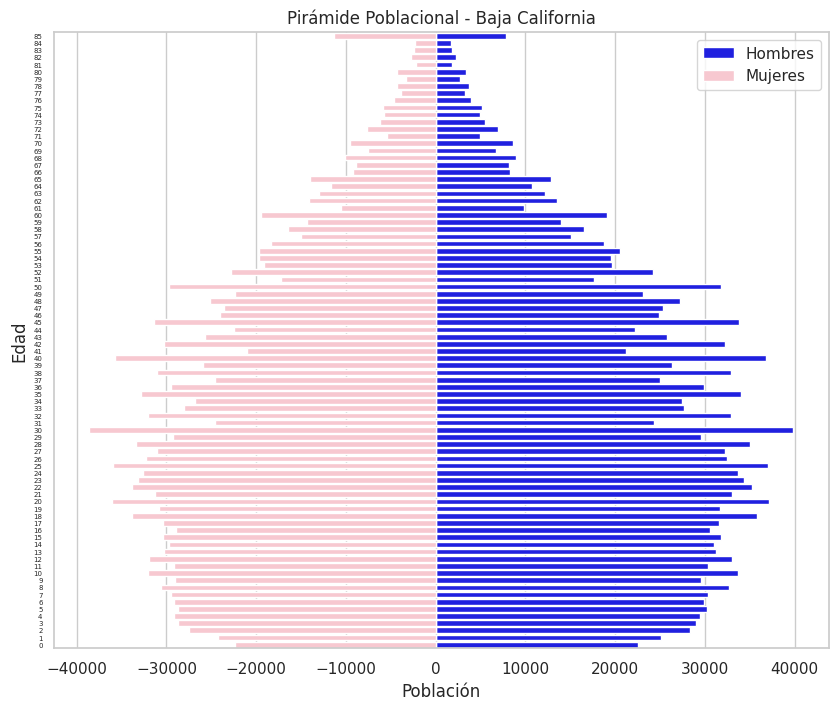

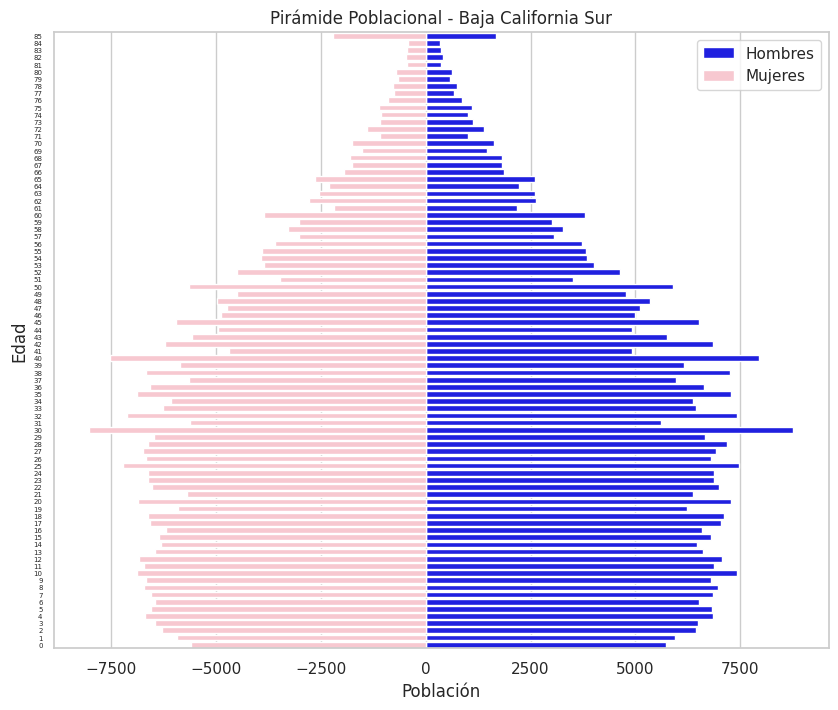

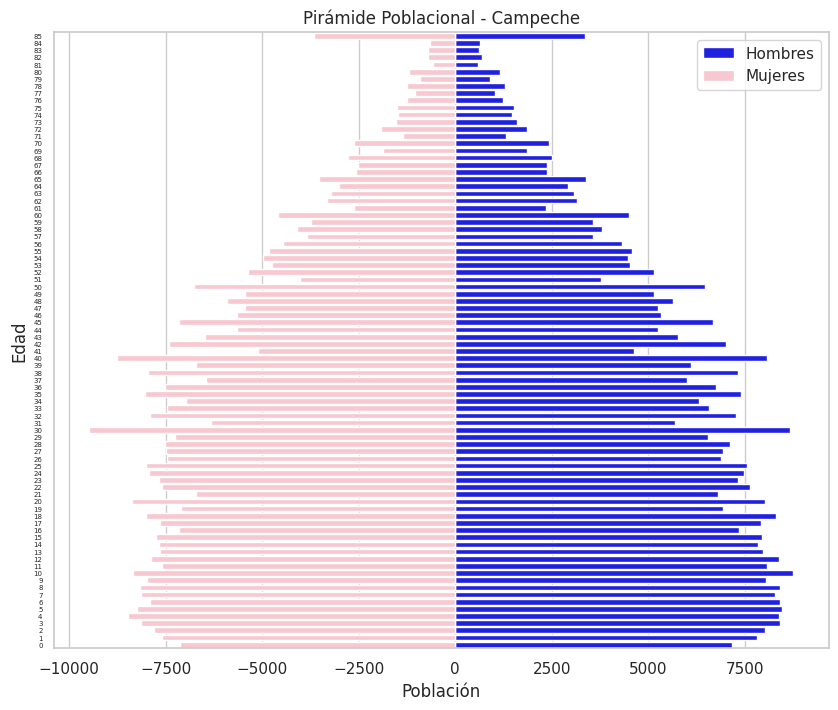

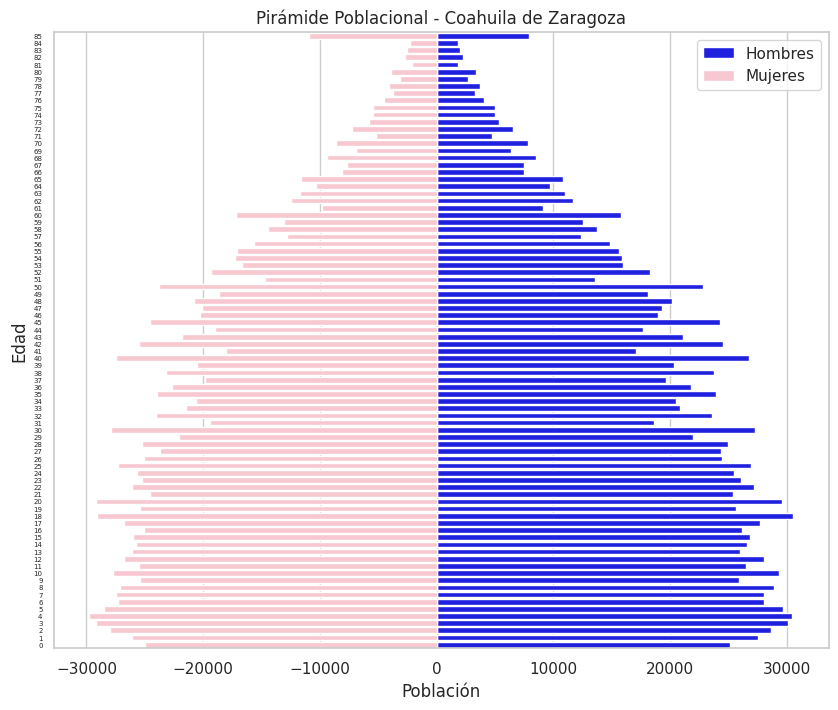

...

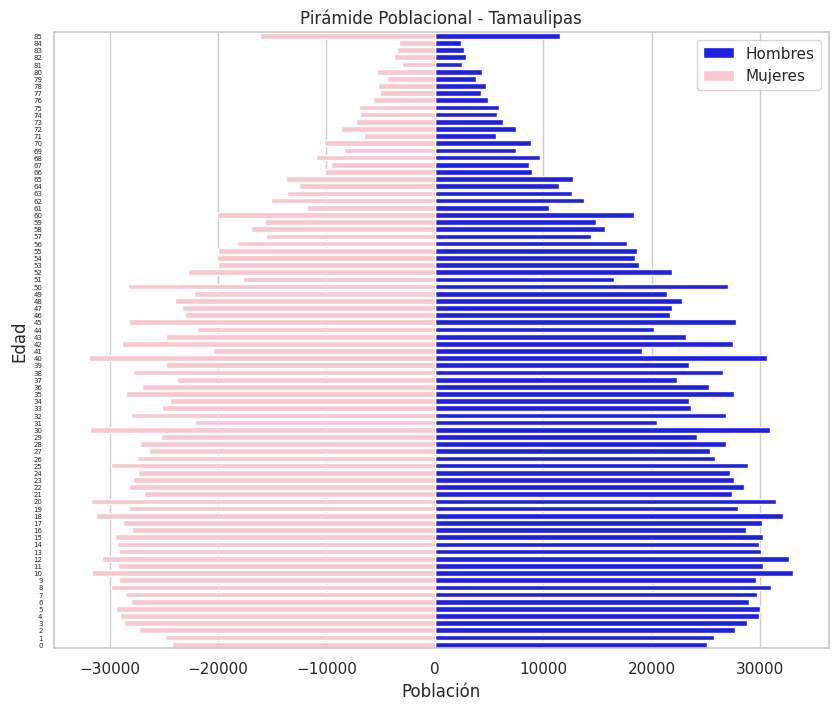

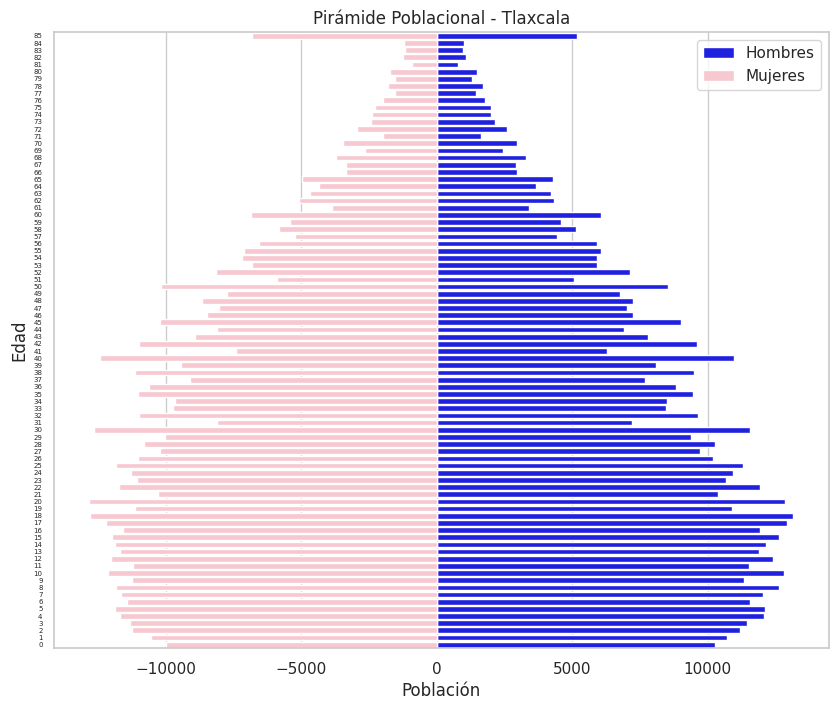

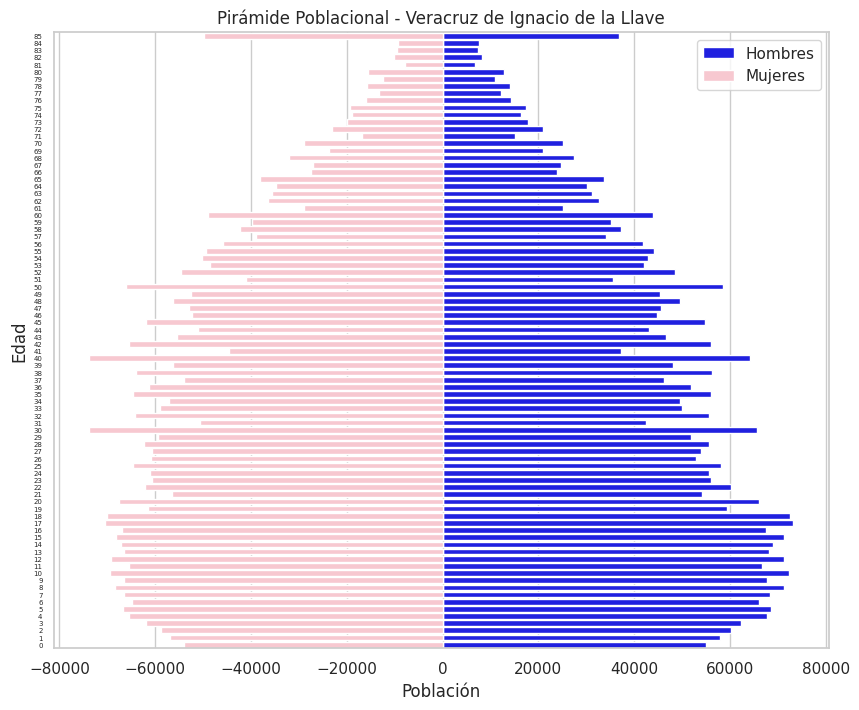

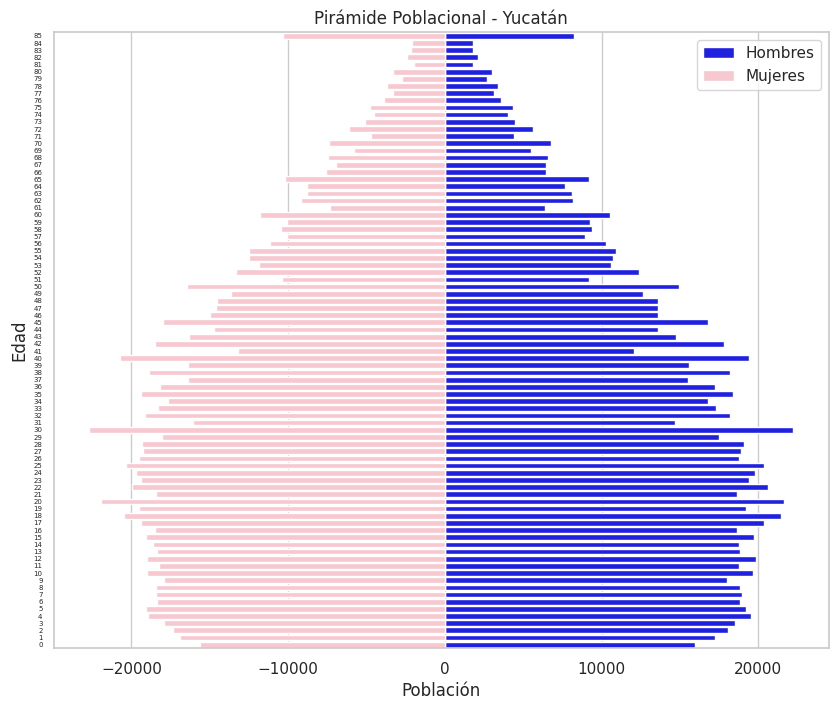

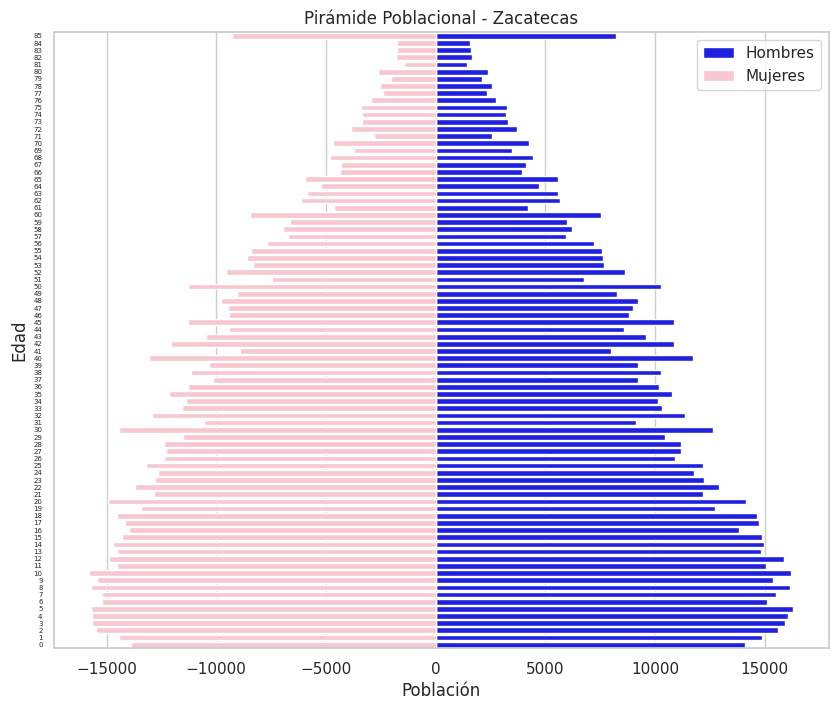

In [ ]:
estados = pob_estado['Entidad'].unique()

for estado in estados:
    data_estado = pob_estado[pob_estado['Entidad'] == estado]

    # Crear una figura y ejes para cada estado
    fig, ax = plt.subplots(figsize=(10, 8))

    # Crear barras apiladas para hombres y mujeres
    sns.barplot(x='hombres', y='edad', data=data_estado, color='blue', label='Hombres', orient='h')
    sns.barplot(x=-data_estado['mujeres'], y='edad', data=data_estado, color='pink', label='Mujeres', orient='h')

    # Configuraciones adicionales
    ax.set_xlabel('Población')
    ax.set_ylabel('Edad')
    ax.set_title(f'Pirámide Poblacional - {estado}')
    ax.legend()

    # Invertir el orden del eje y para que la edad más alta esté arriba
    ax.invert_yaxis()
    ax.tick_params(axis='y', labelsize=5, rotation=0, pad=2)

    # Mostrar la pirámide poblacional para cada estado
    plt.show()

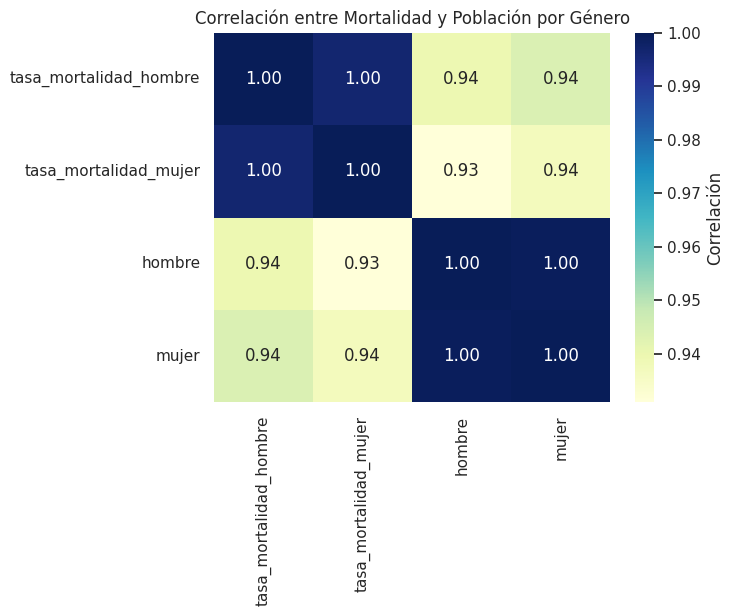

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Suponiendo que "tasa_mortalidad_hombre", "tasa_mortalidad_mujer", "hombre" y "mujer" son columnas en los DataFrames mort_general y pob_general
correlation_data = mort_general[["tasa_mortalidad_hombre", "tasa_mortalidad_mujer"]].join(pob_general[["hombre", "mujer"]])

# Calcular la correlación
cor = correlation_data.corr()

# Crear un mapa de correlación
sns.heatmap(cor, annot=True, cmap="YlGnBu", fmt=".2f", cbar_kws={'label': 'Correlación'})
plt.title('Correlación entre Mortalidad y Población por Género')
plt.show()


In [ ]:
derechohabiencia_general.head()

,entidad,Total,IMSS,ISSSTE,ISSSTE estatal,"Pemex, Defensa o Marina",Instituto de Salud para el Bienestar,IMSS-Bienestar,Institución privada,Otra institución
0,Estados Unidos Mexicanos,92582812,47245909,7165164,1041534,1192255,32842765,958787,2615213,1149542
1,Aguascalientes,1161139,780525,92771,3786,3196,271996,1680,31789,3179
2,Baja California,2905265,1995530,152274,86380,14012,515855,19862,131967,44490
3,Baja California Sur,664122,408856,101745,2549,10772,139342,3576,12335,2516
4,Campeche,719677,288186,62638,2070,32088,327334,8950,7441,2914


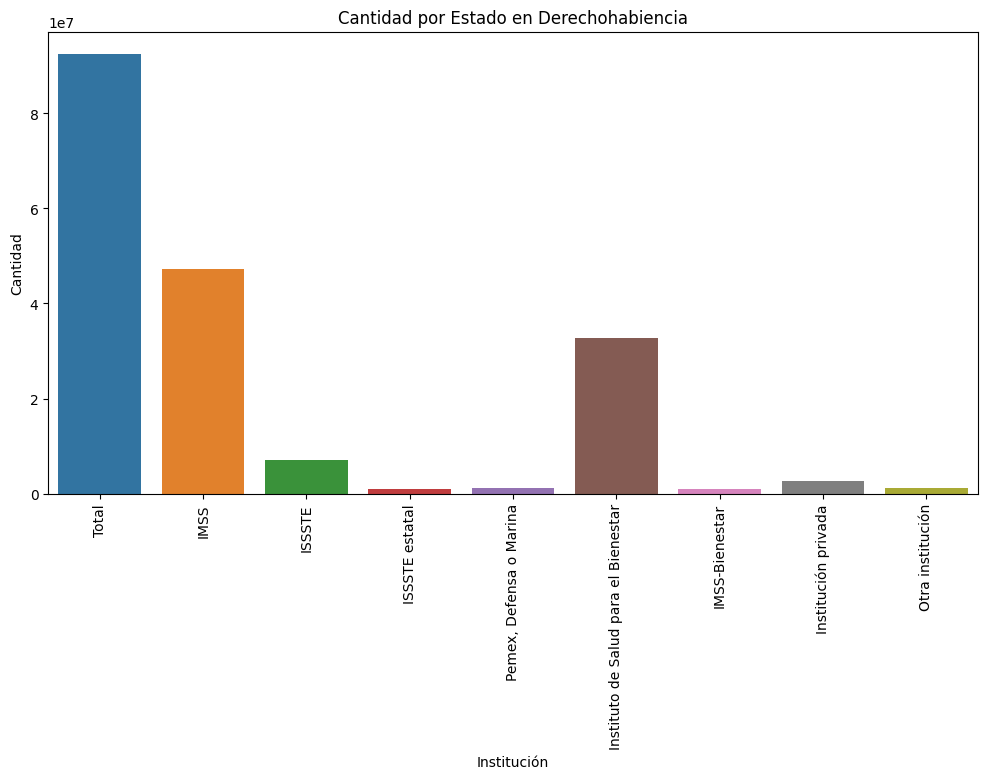

In [ ]:
resultado_por_estado = derechohabiencia_general.groupby('entidad').sum()

# Reorganizar el DataFrame para facilitar la visualización
resultado_por_estado = resultado_por_estado.transpose()

# Graficar la cantidad por estado usando seaborn
plt.figure(figsize=(12, 6))
sns.barplot(x=resultado_por_estado.index, y=resultado_por_estado['Estados Unidos Mexicanos'])
plt.title('Cantidad por Estado en Derechohabiencia')
plt.xlabel('Institución')
plt.ylabel('Cantidad')
plt.xticks(rotation=90)
plt.show()

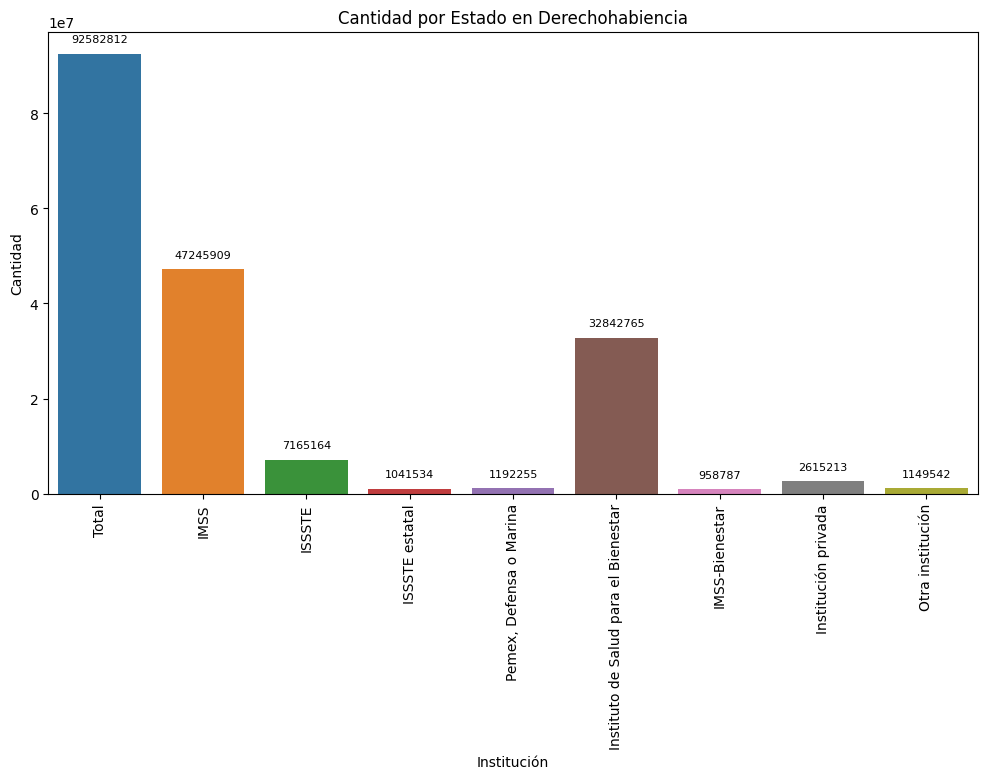

In [ ]:
resultado_por_estado = derechohabiencia_general.groupby('entidad').sum()

# Reorganizar el DataFrame para facilitar la visualización
resultado_por_estado = resultado_por_estado.transpose()

# Graficar la cantidad por estado usando seaborn con valores en las barras
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=resultado_por_estado.index, y=resultado_por_estado['Estados Unidos Mexicanos'])
plt.title('Cantidad por Estado en Derechohabiencia')
plt.xlabel('Institución')
plt.ylabel('Cantidad')
plt.xticks(rotation=90)

# Agregar valores en las barras
for p in ax.patches:
    ax.annotate(f'{p.get_height():.0f}', (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points', fontsize=8)

plt.show()

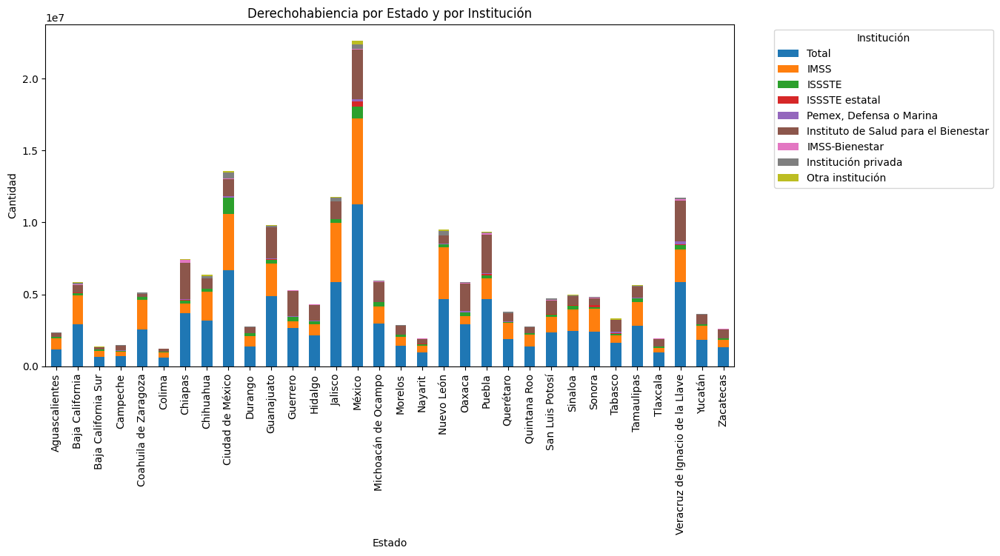

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Suponiendo que ya tienes el DataFrame derechohabiencia_general
# Puedes cargarlo de la siguiente manera:
# derechohabiencia_general = pd.read_csv('ruta_del_archivo.csv')

# Establecer 'entidad' como índice para facilitar la visualización
derechohabiencia_general.set_index('entidad', inplace=True)

# Graficar la cantidad por estado desglosada por institución
ax = derechohabiencia_general.drop('Estados Unidos Mexicanos').plot(kind='bar', stacked=True, figsize=(12, 6))
plt.title('Derechohabiencia por Estado y por Institución')
plt.xlabel('Estado')
plt.ylabel('Cantidad')
plt.legend(title='Institución', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


<Figure size 1000x600 with 0 Axes>

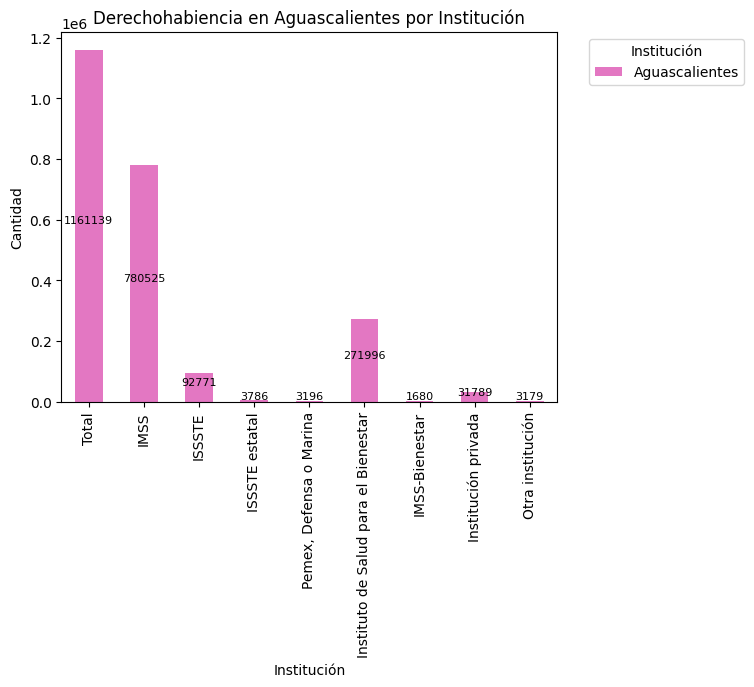

<Figure size 1000x600 with 0 Axes>

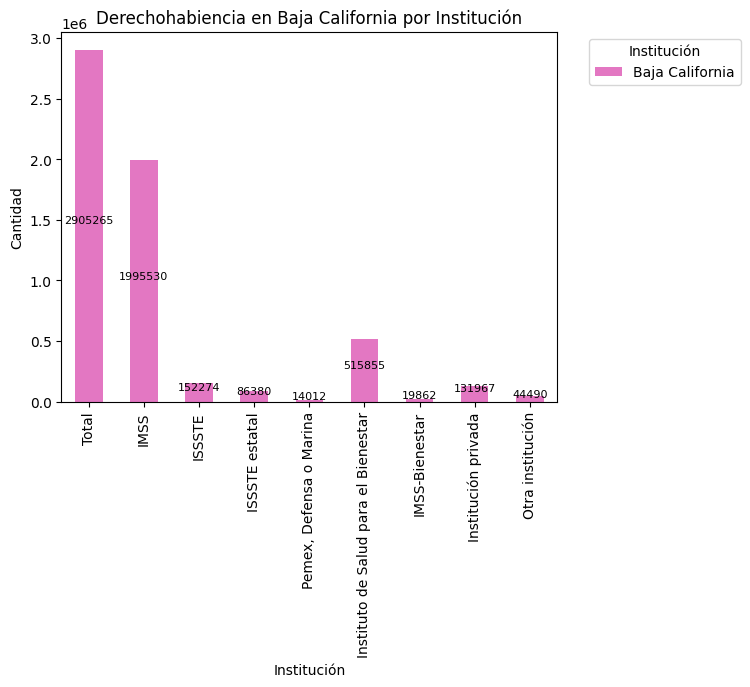

<Figure size 1000x600 with 0 Axes>

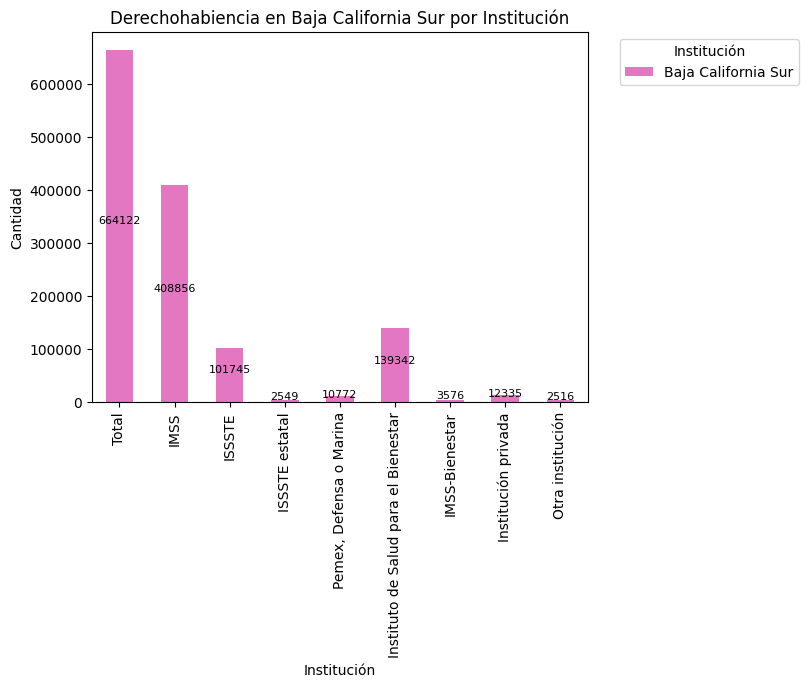

<Figure size 1000x600 with 0 Axes>

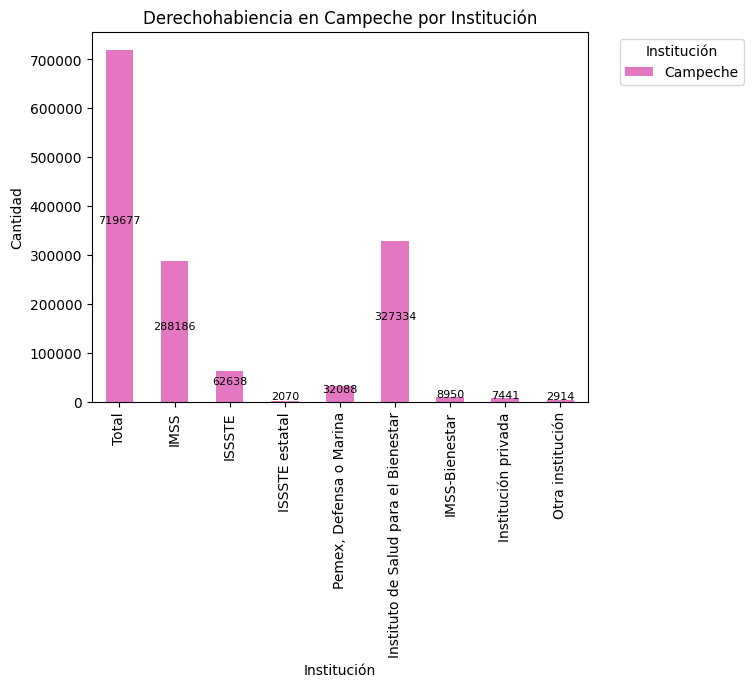

<Figure size 1000x600 with 0 Axes>

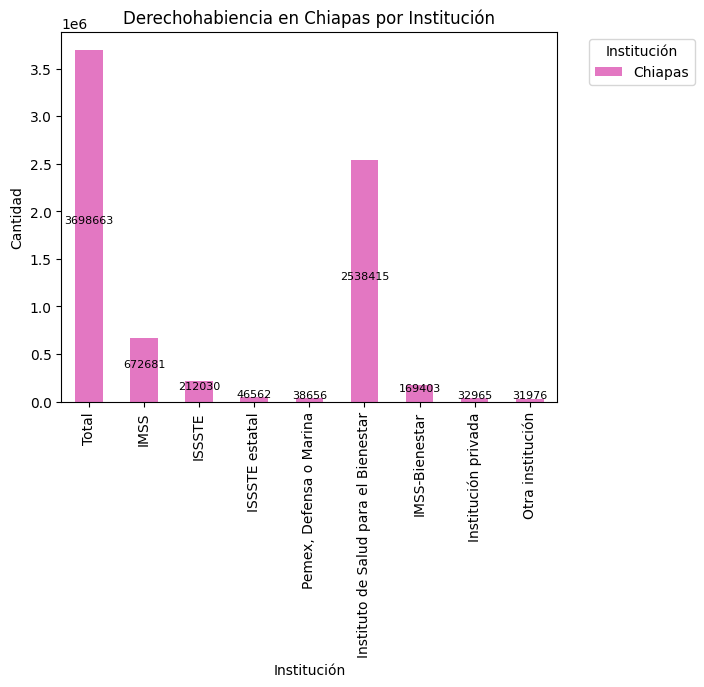

<Figure size 1000x600 with 0 Axes>

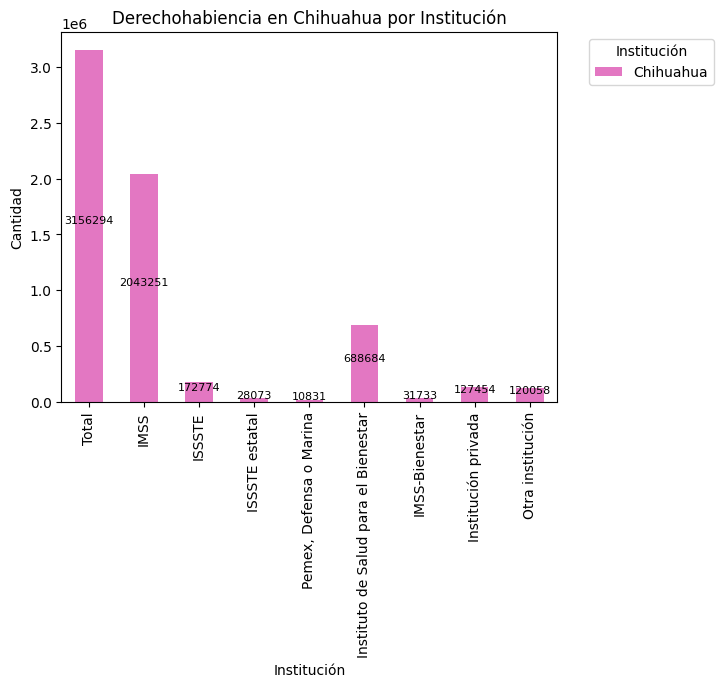

<Figure size 1000x600 with 0 Axes>

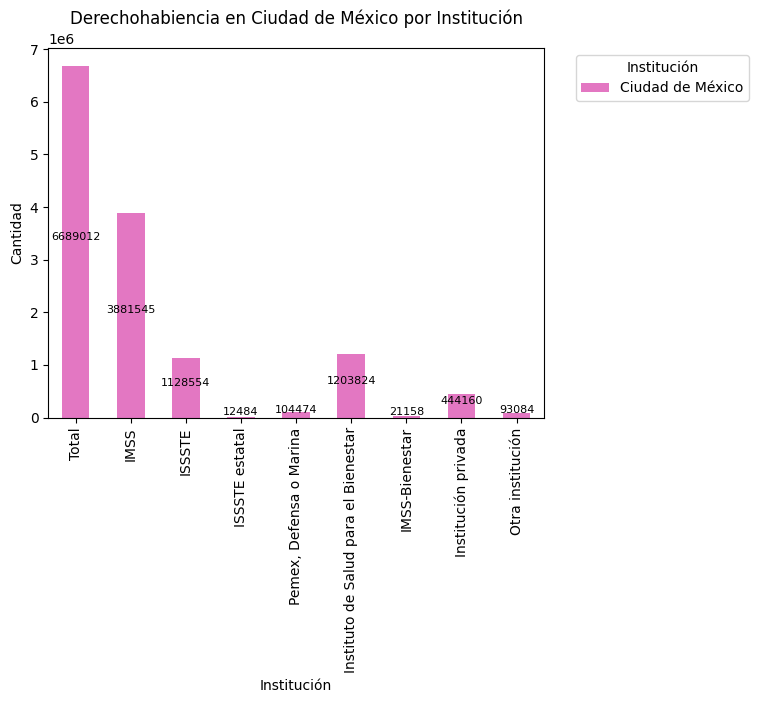

<Figure size 1000x600 with 0 Axes>

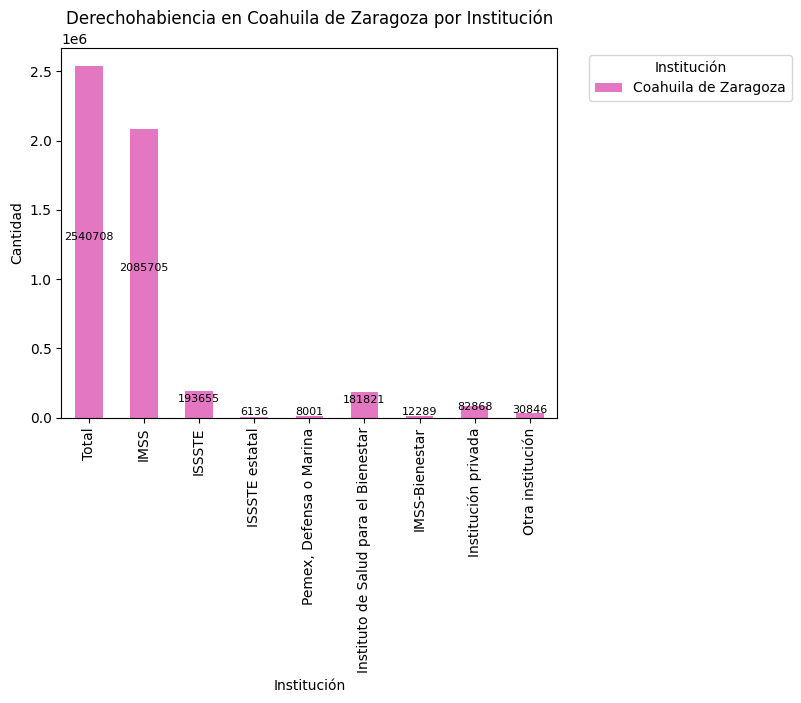

<Figure size 1000x600 with 0 Axes>

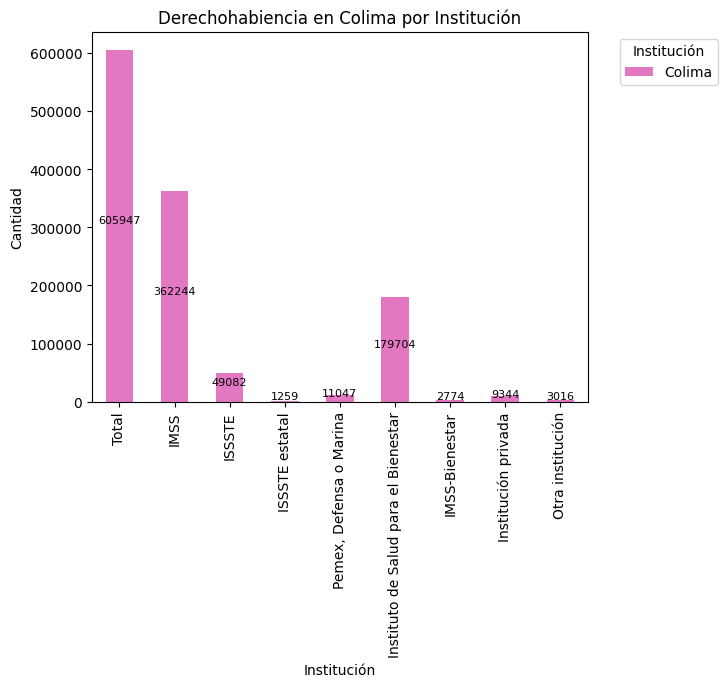

<Figure size 1000x600 with 0 Axes>

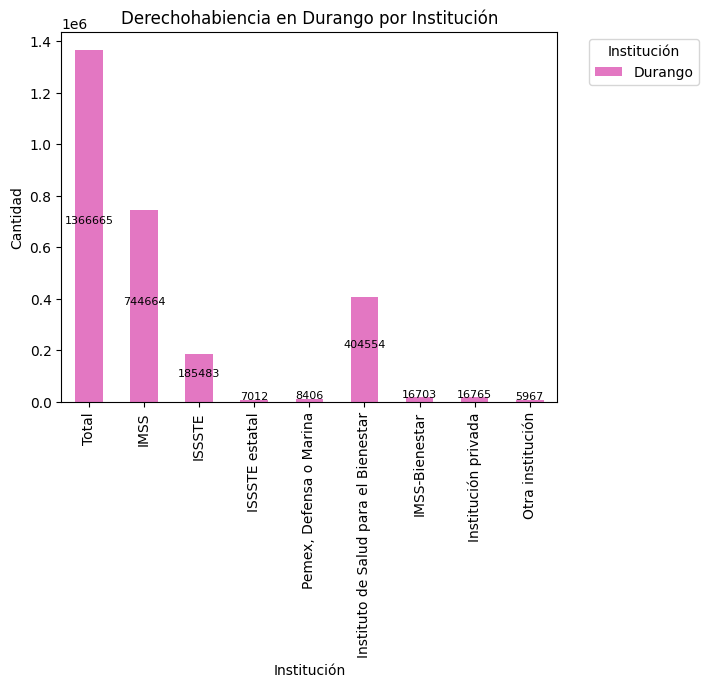

<Figure size 1000x600 with 0 Axes>

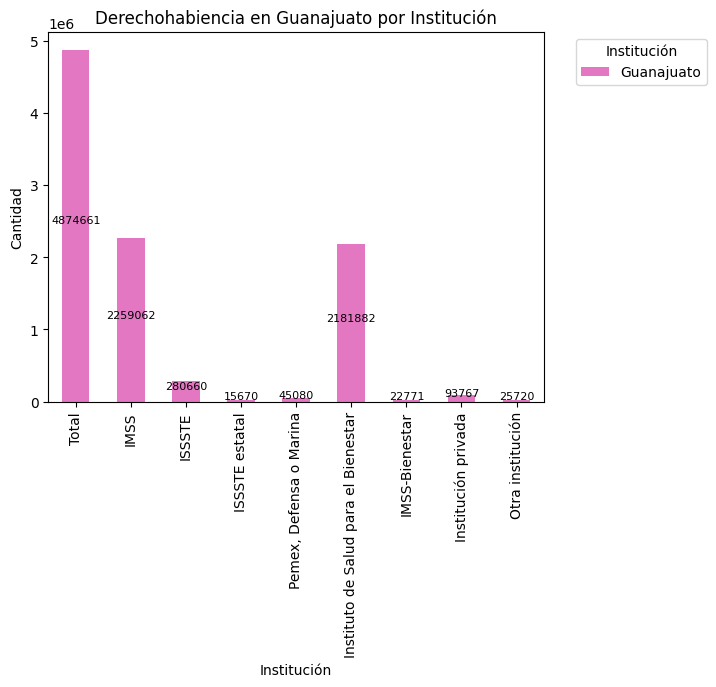

<Figure size 1000x600 with 0 Axes>

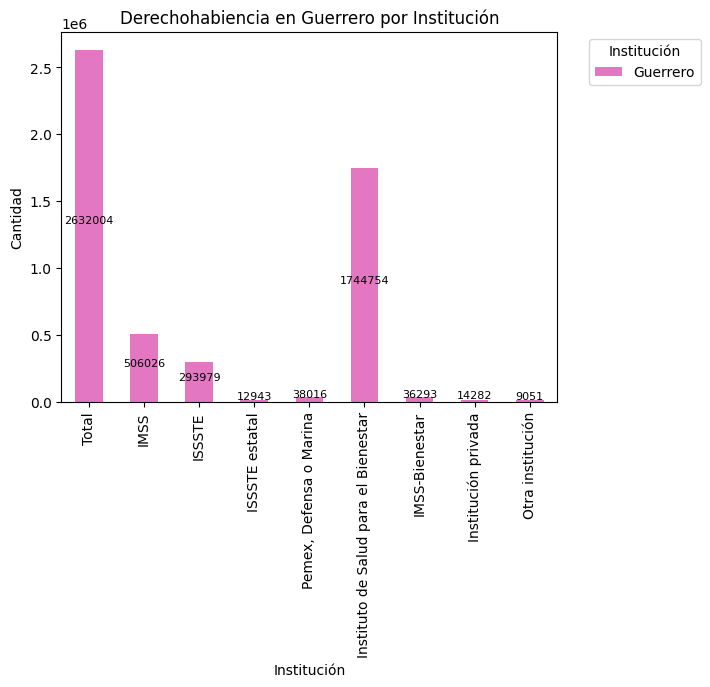

<Figure size 1000x600 with 0 Axes>

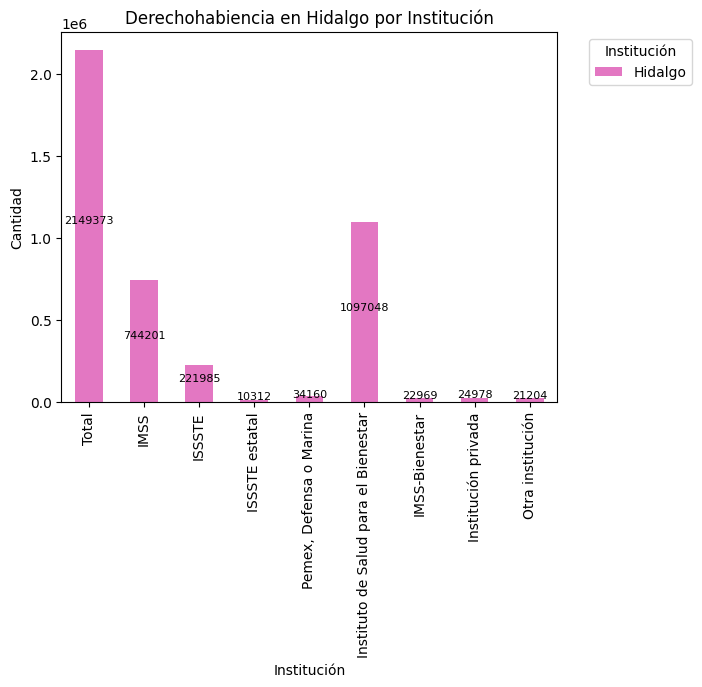

<Figure size 1000x600 with 0 Axes>

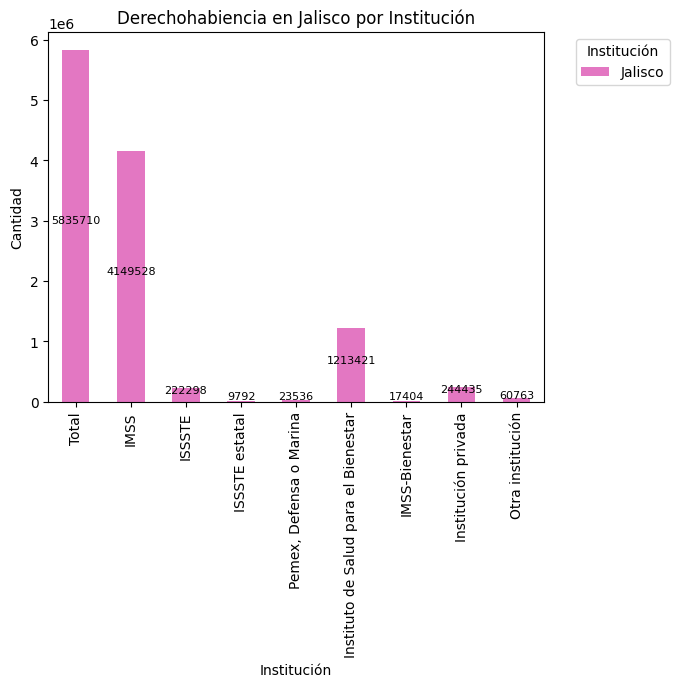

<Figure size 1000x600 with 0 Axes>

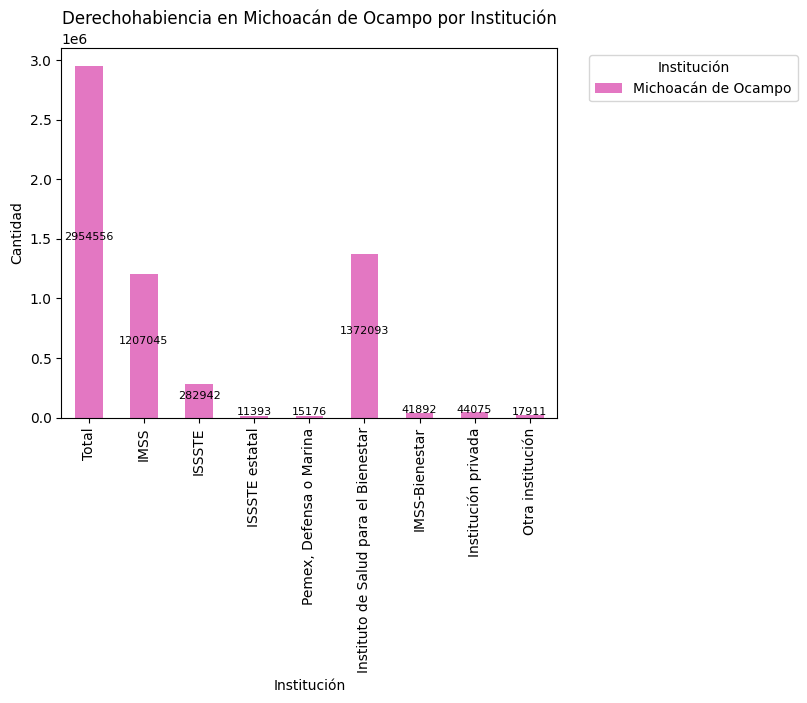

<Figure size 1000x600 with 0 Axes>

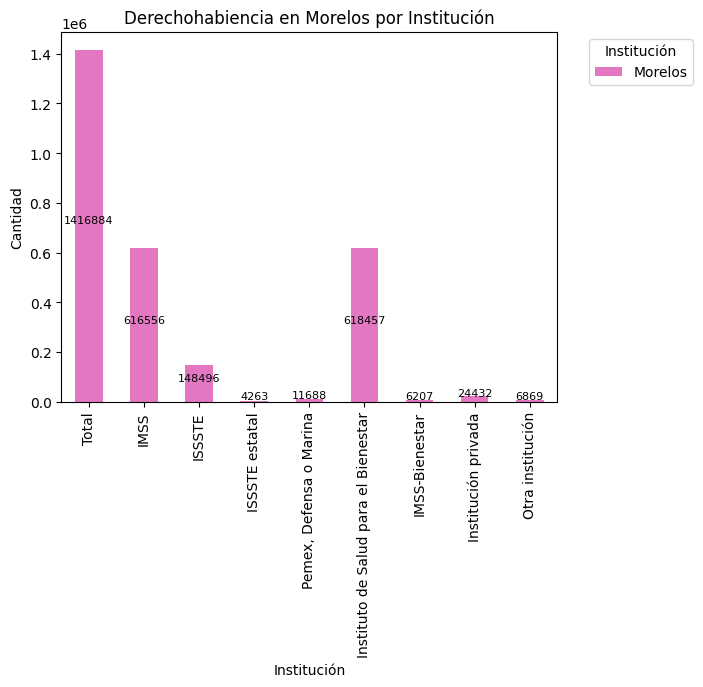

<Figure size 1000x600 with 0 Axes>

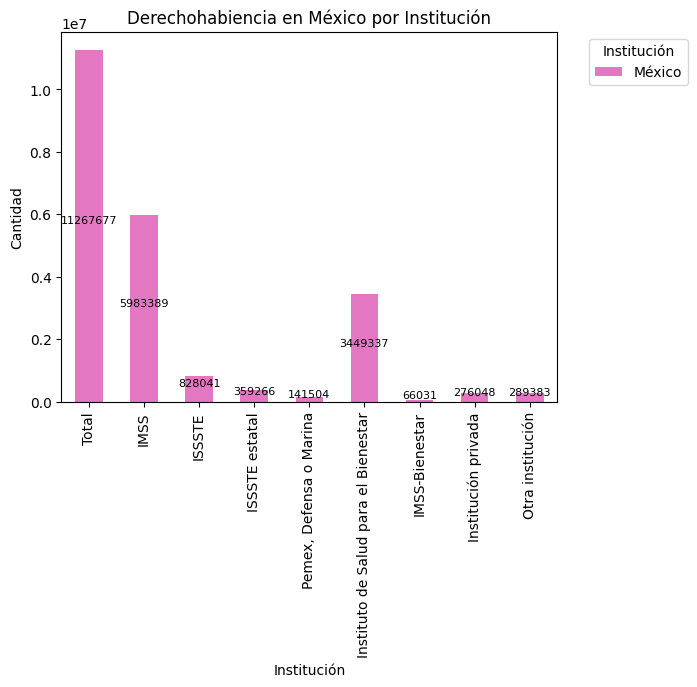

<Figure size 1000x600 with 0 Axes>

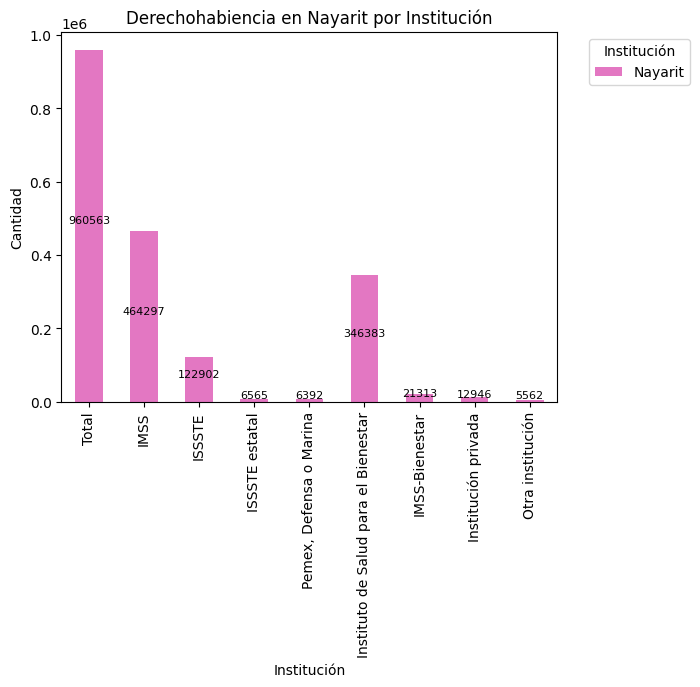

<Figure size 1000x600 with 0 Axes>

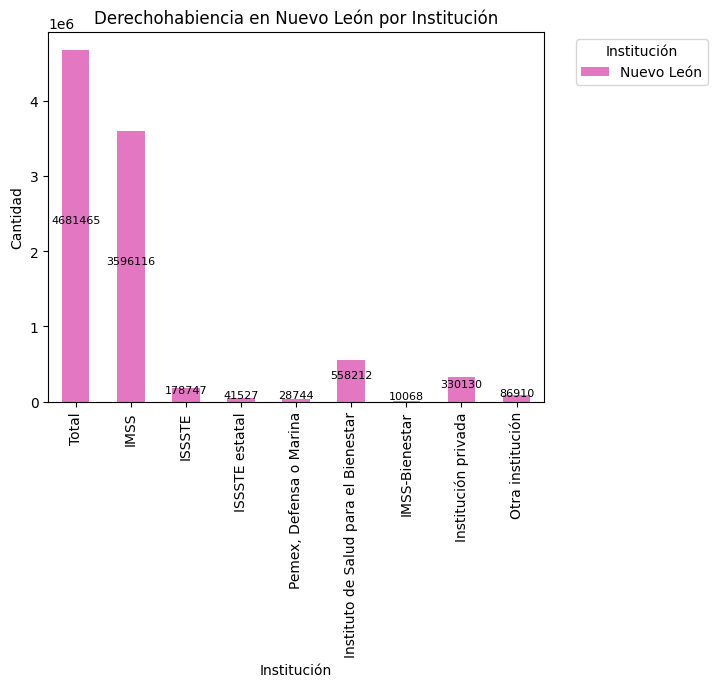

<Figure size 1000x600 with 0 Axes>

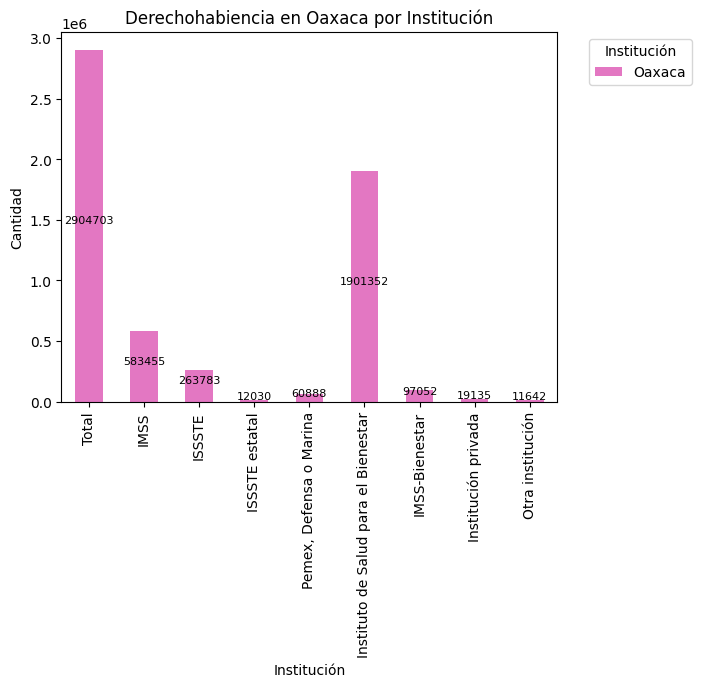

<Figure size 1000x600 with 0 Axes>

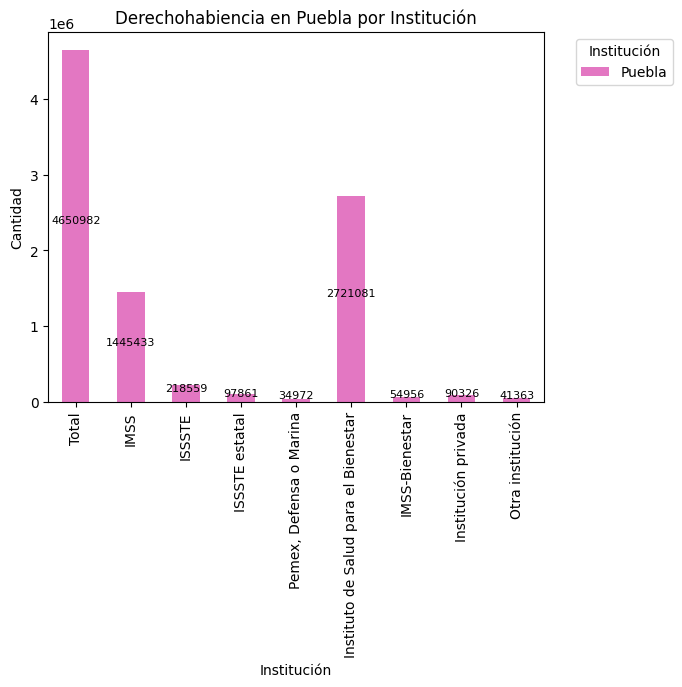

<Figure size 1000x600 with 0 Axes>

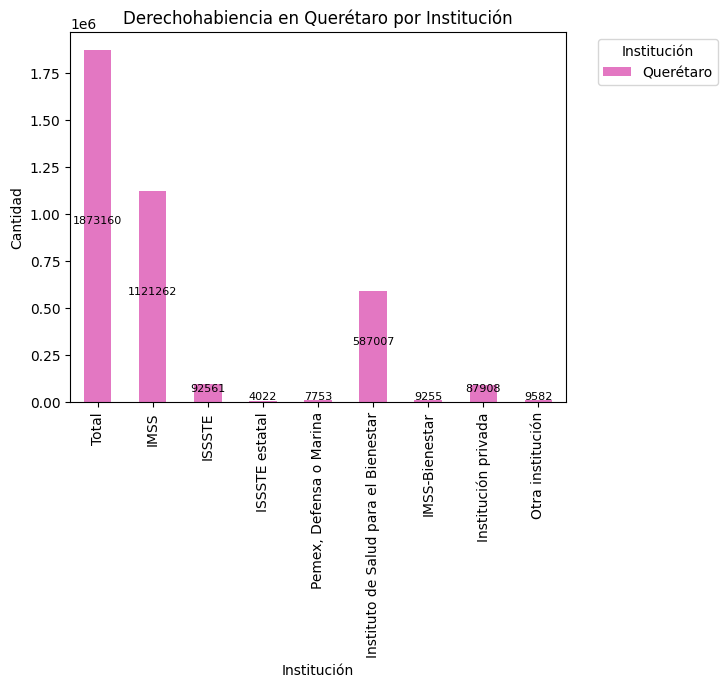

<Figure size 1000x600 with 0 Axes>

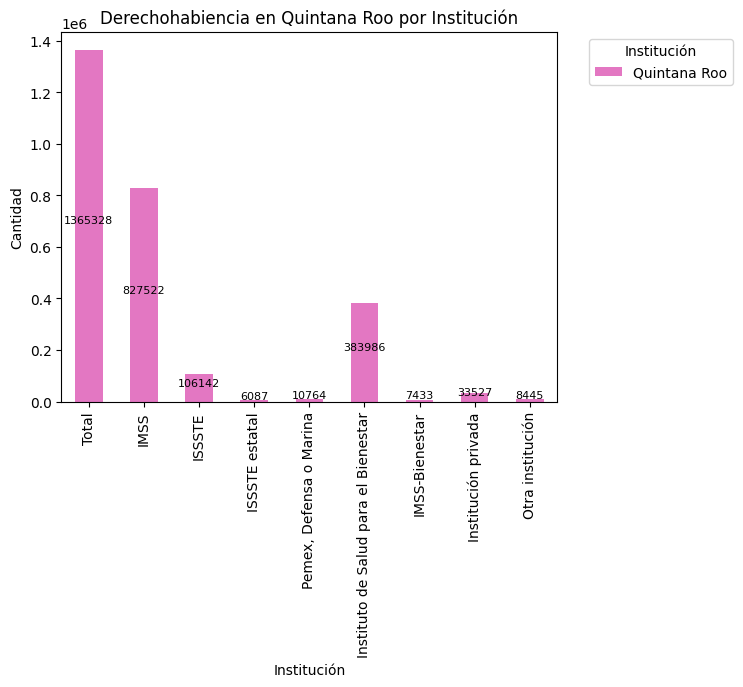

<Figure size 1000x600 with 0 Axes>

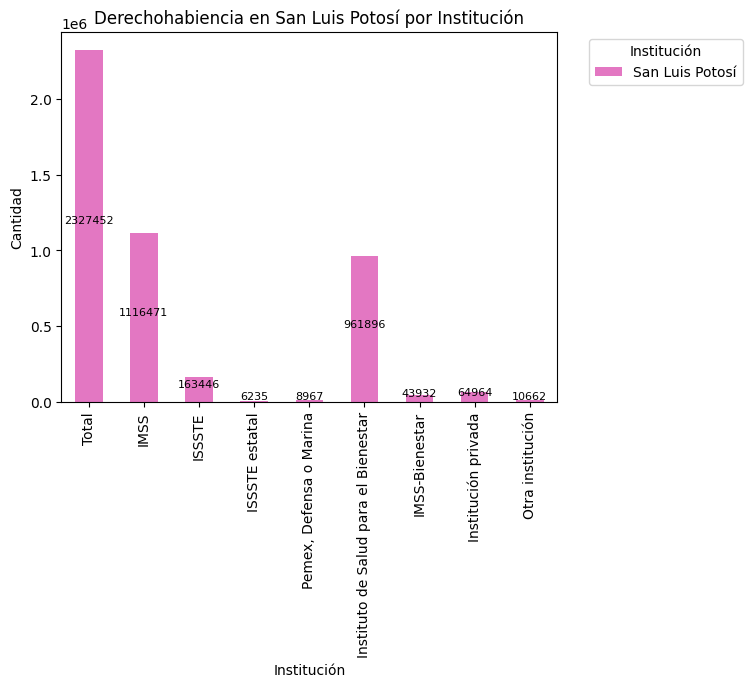

<Figure size 1000x600 with 0 Axes>

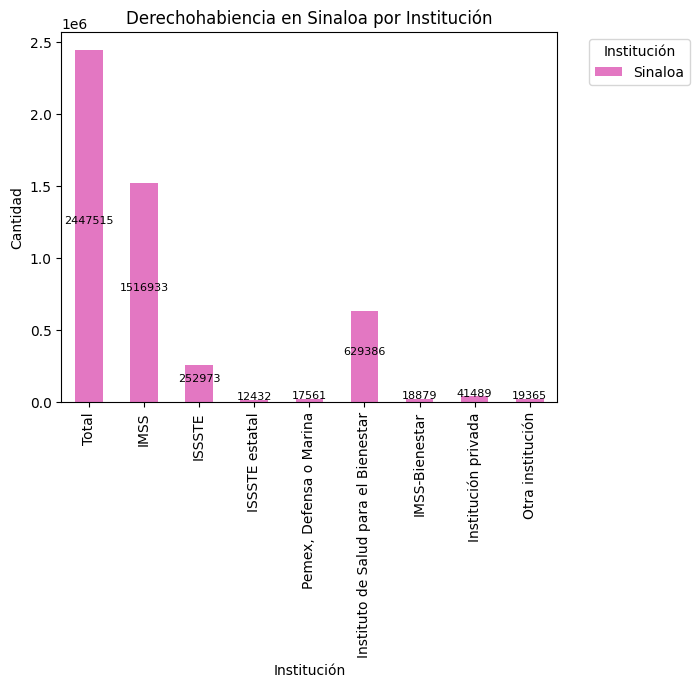

<Figure size 1000x600 with 0 Axes>

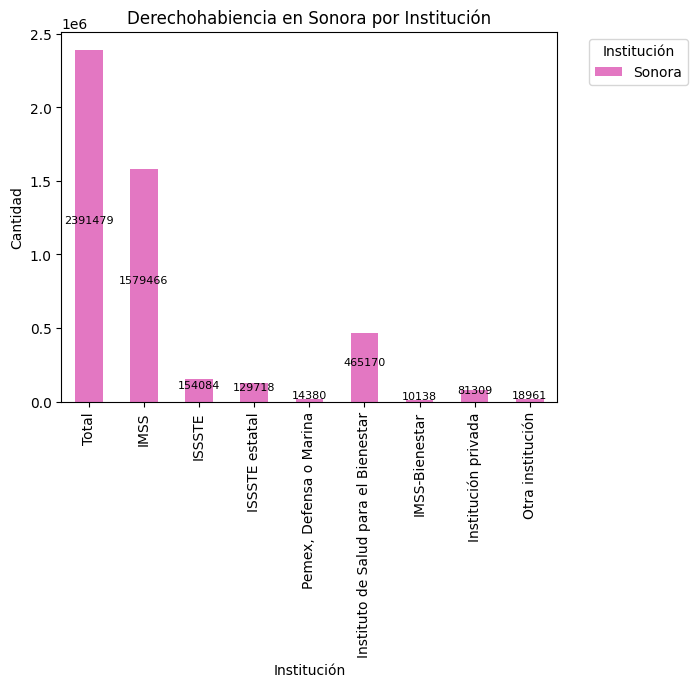

<Figure size 1000x600 with 0 Axes>

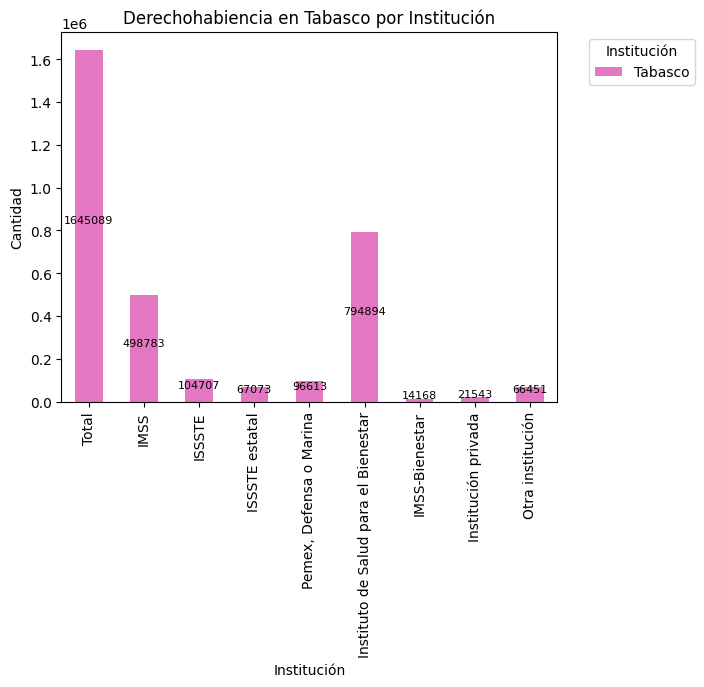

<Figure size 1000x600 with 0 Axes>

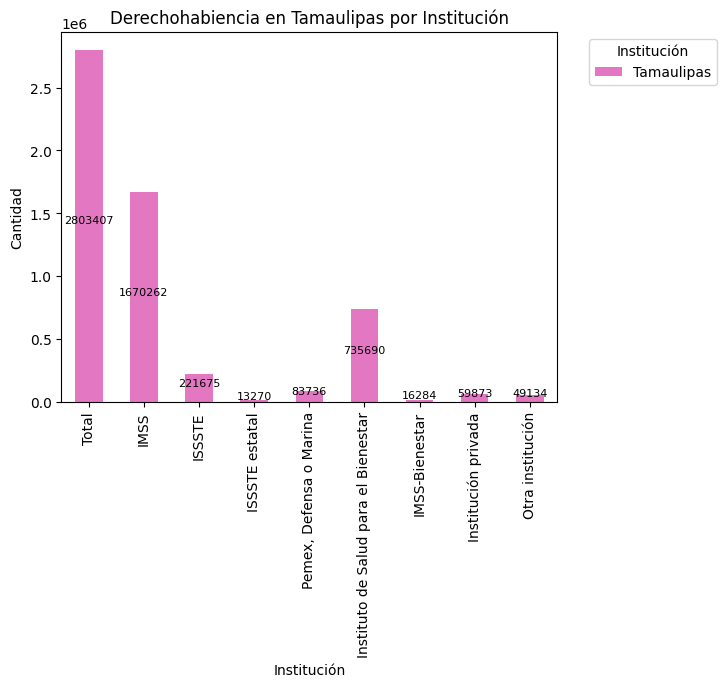

<Figure size 1000x600 with 0 Axes>

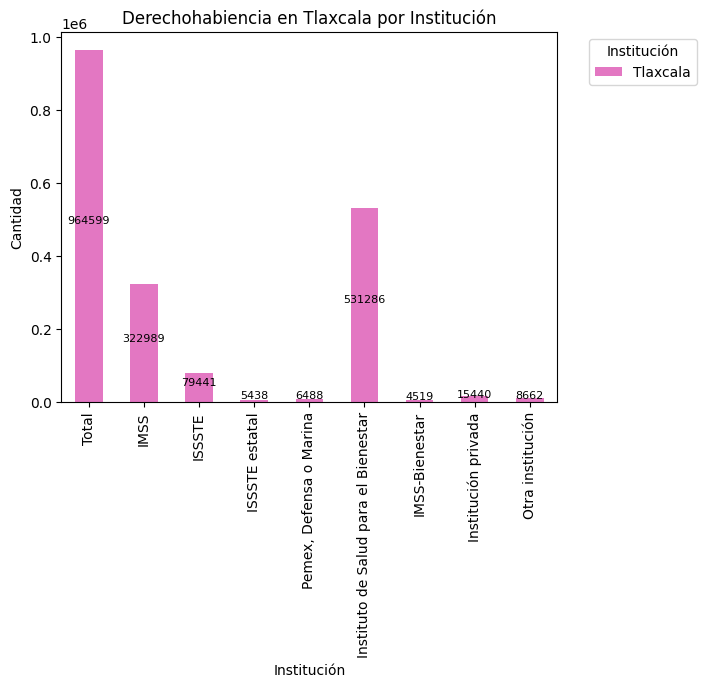

<Figure size 1000x600 with 0 Axes>

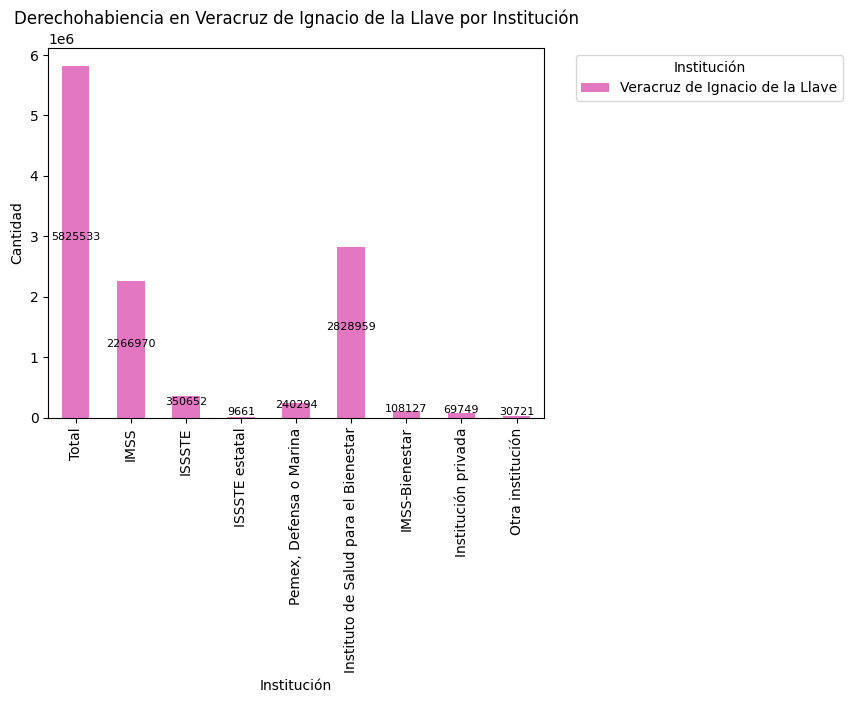

<Figure size 1000x600 with 0 Axes>

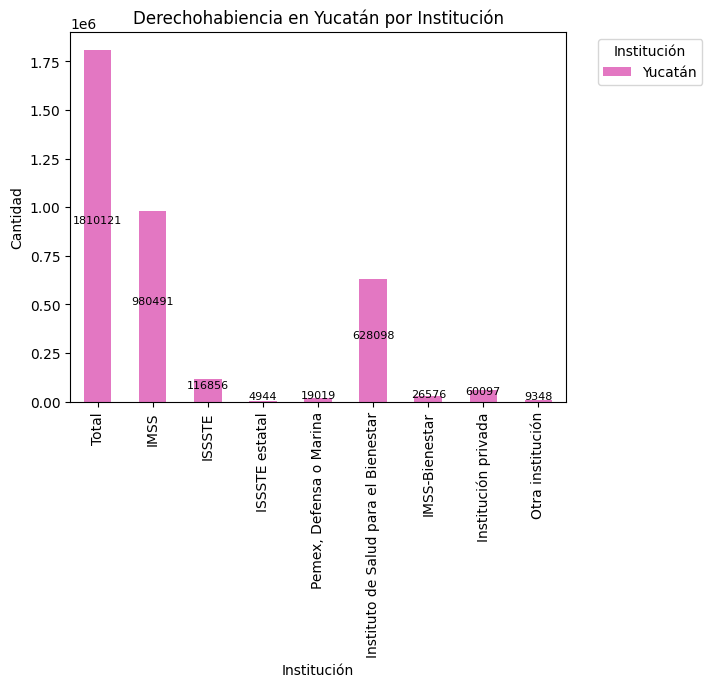

<Figure size 1000x600 with 0 Axes>

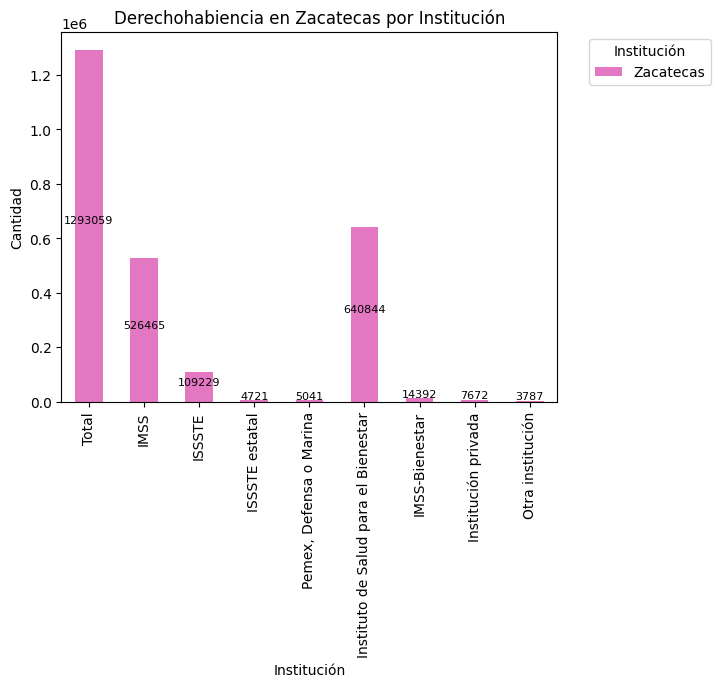

In [ ]:
# Obtener la lista de estados (excluyendo 'Estados Unidos Mexicanos')
#estados = derechohabiencia_general.index.difference(['Estados Unidos Mexicanos'])

for estado in estados:
    plt.figure(figsize=(10, 6))
    colores = sns.color_palette('tab10', n_colors=len(derechohabiencia_general.columns))
    ax = derechohabiencia_general.loc[[estado]].transpose().plot(kind='bar', stacked=True, color=colores[6])
    plt.title(f'Derechohabiencia en {estado} por Institución')
    plt.xlabel('Institución')
    plt.ylabel('Cantidad')
    plt.legend(title='Institución', bbox_to_anchor=(1.05, 1), loc='upper left')

    # Agregar etiquetas de cantidad en cada barra
    for p in ax.patches:
        width, height = p.get_width(), p.get_height()
        x, y = p.get_xy()
        ax.annotate(f'{height:.0f}', (x + width / 2, y + height / 2), ha='center', va='bottom', fontsize=8)

    plt.show()

In [8]:
pea=pd.read_csv(io.BytesIO(uploaded["pea.csv"]),sep=',',decimal='.')
pea.shape

(32, 8)

In [9]:
column_position_to_delete = 7
pea.drop(pea.columns[column_position_to_delete], axis=1, inplace=True)

# Muestra el DataFrame después de eliminar la columna
print(pea)

                             Estado  15 a 19 años  20 a 29 años  30 a 39 años  \
0                    Aguascalientes         36548        147369        142948   
1                   Baja California         59386        384932        427732   
2               Baja California Sur         19909         88339         94323   
3                          Campeche         22110         87299        103249   
4              Coahuila de Zaragoza         61621        314256        315403   
5                            Colima         21039         73039         78922   
6                           Chiapas        184954        424415        489744   
7                         Chihuahua         73779        416178        384199   
8                  Ciudad de México         85597        721240       1016157   
9                           Durango         54187        160559        182394   
10                       Guanajuato        200552        624457        633477   
11                         G

In [10]:
pea['pea_total'] = pea.sum(axis=1)
pea.head()

<ipython-input-10-2553515fd60c>:1: FutureWarning: Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.
  pea['pea_total'] = pea.sum(axis=1)


,Estado,15 a 19 años,20 a 29 años,30 a 39 años,40 a 49 años,50 a 59 años,60 años y más,pea_total
0,Aguascalientes,36548,147369,142948,122347,97484,38991,585687
1,Baja California,59386,384932,427732,394058,289998,119659,1675765
2,Baja California Sur,19909,88339,94323,89126,51398,28426,371521
3,Campeche,22110,87299,103249,93190,60722,35718,402288
4,Coahuila de Zaragoza,61621,314256,315403,323438,224822,100898,1340438


In [11]:
pea_total = pea[['Estado', 'pea_total']]

# Mostrar el DataFrame resultante
print(pea_total)

                             Estado  pea_total
0                    Aguascalientes     585687
1                   Baja California    1675765
2               Baja California Sur     371521
3                          Campeche     402288
4              Coahuila de Zaragoza    1340438
5                            Colima     336617
6                           Chiapas    2041000
7                         Chihuahua    1646235
8                  Ciudad de México    3888821
9                           Durango     761051
10                       Guanajuato    2588362
11                         Guerrero    1485191
12                          Hidalgo    1258776
13                          Jalisco    3638798
14                           México    6860422
15              Michoacán de Ocampo    1927870
16                          Morelos     833935
17                          Nayarit     607983
18                       Nuevo León    2640939
19                           Oaxaca    1863530
20           

In [12]:
derechohabiencia_general.head()

,entidad,Total,IMSS,ISSSTE,ISSSTE estatal,"Pemex, Defensa o Marina",Instituto de Salud para el Bienestar,IMSS-Bienestar,Institución privada,Otra institución
0,Estados Unidos Mexicanos,92582812,47245909,7165164,1041534,1192255,32842765,958787,2615213,1149542
1,Aguascalientes,1161139,780525,92771,3786,3196,271996,1680,31789,3179
2,Baja California,2905265,1995530,152274,86380,14012,515855,19862,131967,44490
3,Baja California Sur,664122,408856,101745,2549,10772,139342,3576,12335,2516
4,Campeche,719677,288186,62638,2070,32088,327334,8950,7441,2914


In [13]:
indice_a_eliminar = 0

# Eliminar la fila
derechohabiencia_general = derechohabiencia_general.drop(indice_a_eliminar)

# Mostrar DataFrame después de eliminar la fila



In [14]:
derechohabiencia_general = derechohabiencia_general.reset_index(drop=True)

In [18]:
pib.head()

,Entidad,pib2018,pib2019,pib2020
0,Aguascalientes,17786.78,17317.48,16087.68
1,Baja California,55753.02,57201.96,54791.87
2,Baja California Sur,15040.91,15624.71,14323.63
3,Campeche,10924.12,10409.51,9737.03
4,Coahuila de Zaragoza,41909.00,41702.45,38087.26


In [19]:
ppd=pd.concat([derechohabiencia_general, pib,pea_total], axis=1)
ppd

,entidad,Total,IMSS,ISSSTE,ISSSTE estatal,"Pemex, Defensa o Marina",Instituto de Salud para el Bienestar,IMSS-Bienestar,Institución privada,Otra institución,Entidad,pib2018,pib2019,pib2020,Estado,pea_total
0,Aguascalientes,1161139,780525,92771,3786,3196,271996,1680,31789,3179,Aguascalientes,17786.78,17317.48,16087.68,Aguascalientes,585687
1,Baja California,2905265,1995530,152274,86380,14012,515855,19862,131967,44490,Baja California,55753.02,57201.96,54791.87,Baja California,1675765
2,Baja California Sur,664122,408856,101745,2549,10772,139342,3576,12335,2516,Baja California Sur,15040.91,15624.71,14323.63,Baja California Sur,371521
3,Campeche,719677,288186,62638,2070,32088,327334,8950,7441,2914,Campeche,10924.12,10409.51,9737.03,Campeche,402288
4,Coahuila de Zaragoza,2540708,2085705,193655,6136,8001,181821,12289,82868,30846,Coahuila de Zaragoza,41909.00,41702.45,38087.26,Coahuila de Zaragoza,1340438
5,Colima,605947,362244,49082,1259,11047,179704,2774,9344,3016,Colima,12841.65,12860.31,12427.06,Colima,336617
6,Chiapas,3698663,672681,212030,46562,38656,2538415,169403,32965,31976,Chiapas,32106.05,33252.21,31684.44,Chiapas,2041000
7,Chihuahua,3156294,2043251,172774,28073,10831,688684,31733,127454,120058,Chihuahua,50011.18,49160.44,46030.26,Chihuahua,1646235
8,Ciudad de México,6689012,3881545,1128554,12484,104474,1203824,21158,444160,93084,Ciudad de México,259591.10,259694.19,220952.41,Ciudad de México,3888821
9,Durango,1366665,744664,185483,7012,8406,404554,16703,16765,5967,Durango,17786.02,17902.30,16450.31,Durango,761051


In [20]:
columnas_a_eliminar = ['Entidad', 'pib2018', 'pib2019','Estado']
ppd = ppd.drop(columnas_a_eliminar, axis=1)

In [21]:
ppd

,entidad,Total,IMSS,ISSSTE,ISSSTE estatal,"Pemex, Defensa o Marina",Instituto de Salud para el Bienestar,IMSS-Bienestar,Institución privada,Otra institución,pib2020,pea_total
0,Aguascalientes,1161139,780525,92771,3786,3196,271996,1680,31789,3179,16087.68,585687
1,Baja California,2905265,1995530,152274,86380,14012,515855,19862,131967,44490,54791.87,1675765
2,Baja California Sur,664122,408856,101745,2549,10772,139342,3576,12335,2516,14323.63,371521
3,Campeche,719677,288186,62638,2070,32088,327334,8950,7441,2914,9737.03,402288
4,Coahuila de Zaragoza,2540708,2085705,193655,6136,8001,181821,12289,82868,30846,38087.26,1340438
5,Colima,605947,362244,49082,1259,11047,179704,2774,9344,3016,12427.06,336617
6,Chiapas,3698663,672681,212030,46562,38656,2538415,169403,32965,31976,31684.44,2041000
7,Chihuahua,3156294,2043251,172774,28073,10831,688684,31733,127454,120058,46030.26,1646235
8,Ciudad de México,6689012,3881545,1128554,12484,104474,1203824,21158,444160,93084,220952.41,3888821
9,Durango,1366665,744664,185483,7012,8406,404554,16703,16765,5967,16450.31,761051


In [22]:
percentiles_25 = ppd['pib2020'].quantile(0.25)
percentiles_75 = ppd['pib2020'].quantile(0.75)

# Crear una nueva columna 'Categoria'
ppd['categoria'] = np.where(ppd['pib2020'] > percentiles_75, 1,
                             np.where(ppd['pib2020'] >= percentiles_25, 2, 3))

# Mostrar DataFrame con la nueva columna 'Categoria'
print(ppd)


                            entidad     Total     IMSS   ISSSTE  \
0                    Aguascalientes   1161139   780525    92771   
1                   Baja California   2905265  1995530   152274   
2               Baja California Sur    664122   408856   101745   
3                          Campeche    719677   288186    62638   
4              Coahuila de Zaragoza   2540708  2085705   193655   
5                            Colima    605947   362244    49082   
6                           Chiapas   3698663   672681   212030   
7                         Chihuahua   3156294  2043251   172774   
8                  Ciudad de México   6689012  3881545  1128554   
9                           Durango   1366665   744664   185483   
10                       Guanajuato   4874661  2259062   280660   
11                         Guerrero   2632004   506026   293979   
12                          Hidalgo   2149373   744201   221985   
13                          Jalisco   5835710  4149528   22229

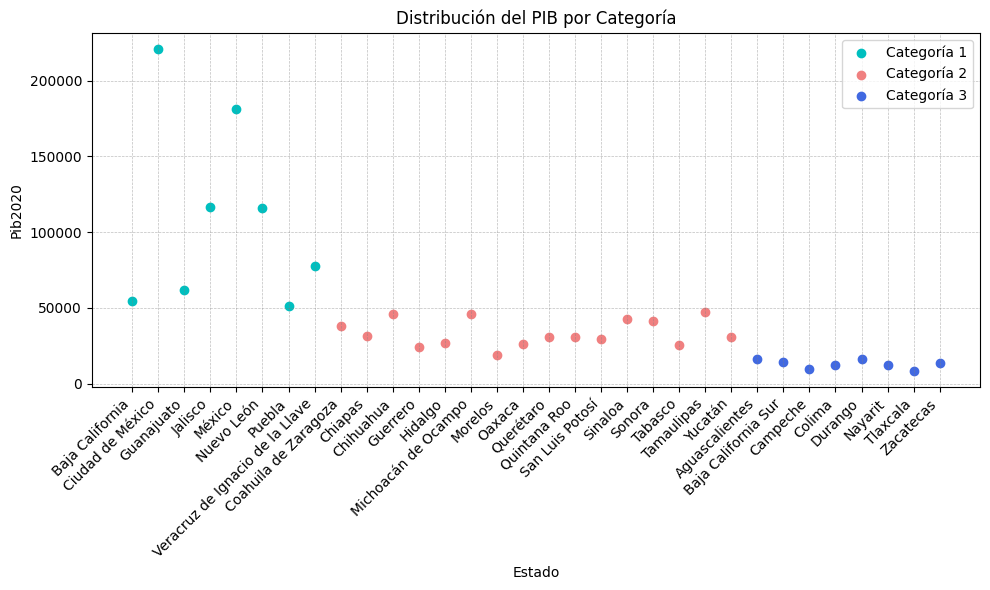

In [43]:
# Graficar cada categoría con un color diferente
plt.figure(figsize=(10, 6))

colors = {1: 'c', 2: 'lightcoral', 3: 'royalblue'}

for categoria, color in colors.items():
    subset = ppd[ppd['categoria'] == categoria]
    plt.scatter(subset['entidad'], subset['pib2020'], label=f'Categoría {categoria}', color=color)

# Otros ajustes
plt.xlabel('Estado')
plt.ylabel('Pib2020')
plt.title('Distribución del PIB por Categoría')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.show()

In [25]:
percentiles_25 = ppd['Total'].quantile(0.25)
percentiles_75 = ppd['Total'].quantile(0.75)

# Crear una nueva columna 'Categoria'
ppd['categoria_dh'] = np.where(ppd['Total'] > percentiles_75, 1,
                             np.where(ppd['Total'] >= percentiles_25, 2, 3))

# Mostrar DataFrame con la nueva columna 'Categoria'
print(ppd)


                            entidad     Total     IMSS   ISSSTE  \
0                    Aguascalientes   1161139   780525    92771   
1                   Baja California   2905265  1995530   152274   
2               Baja California Sur    664122   408856   101745   
3                          Campeche    719677   288186    62638   
4              Coahuila de Zaragoza   2540708  2085705   193655   
5                            Colima    605947   362244    49082   
6                           Chiapas   3698663   672681   212030   
7                         Chihuahua   3156294  2043251   172774   
8                  Ciudad de México   6689012  3881545  1128554   
9                           Durango   1366665   744664   185483   
10                       Guanajuato   4874661  2259062   280660   
11                         Guerrero   2632004   506026   293979   
12                          Hidalgo   2149373   744201   221985   
13                          Jalisco   5835710  4149528   22229

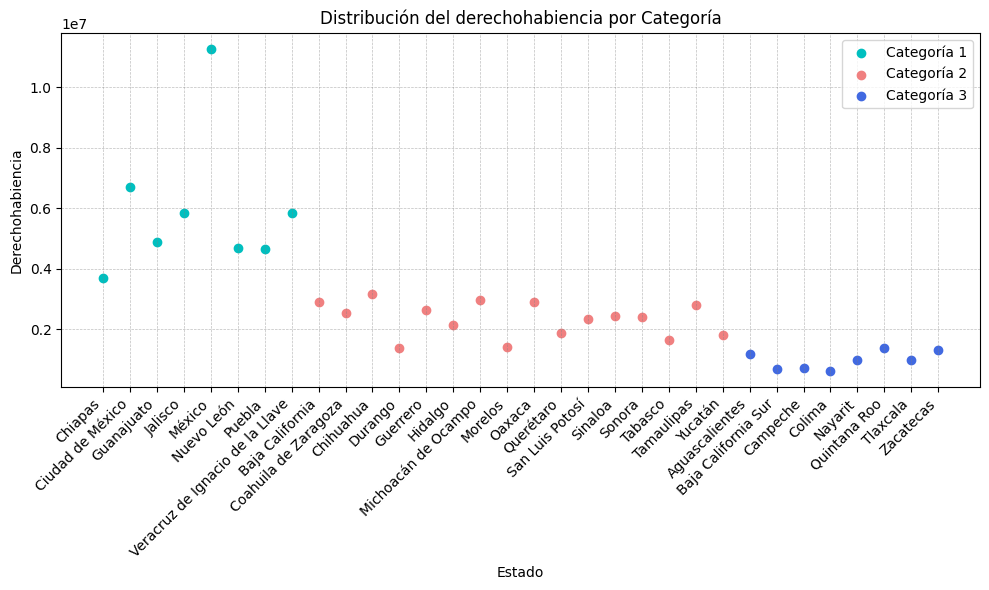

In [42]:
# Graficar cada categoría con un color diferente
plt.figure(figsize=(10, 6))

colors = {1: 'c', 2: 'lightcoral', 3: 'royalblue'}

for categoria_dh, color in colors.items():
    subset = ppd[ppd['categoria_dh'] == categoria_dh]
    plt.scatter(subset['entidad'], subset['Total'], label=f'Categoría {categoria_dh}', color=color)

# Otros ajustes
plt.xlabel('Estado')
plt.ylabel('Derechohabiencia')
plt.title('Distribución del derechohabiencia por Categoría')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.show()

In [36]:
percentiles_25 = ppd['pea_total'].quantile(0.25)
percentiles_75 = ppd['pea_total'].quantile(0.75)

# Crear una nueva columna 'Categoria'
ppd['categoria_pea'] = np.where(ppd['pea_total'] > percentiles_75, 1,
                             np.where(ppd['pea_total'] >= percentiles_25, 2, 3))

In [38]:
ppd.head()


,entidad,Total,IMSS,ISSSTE,ISSSTE estatal,"Pemex, Defensa o Marina",Instituto de Salud para el Bienestar,IMSS-Bienestar,Institución privada,Otra institución,pib2020,pea_total,categoria,categoria_dh,categoria_pea
0,Aguascalientes,1161139,780525,92771,3786,3196,271996,1680,31789,3179,16087.68,585687,3,3,3
1,Baja California,2905265,1995530,152274,86380,14012,515855,19862,131967,44490,54791.87,1675765,1,2,2
2,Baja California Sur,664122,408856,101745,2549,10772,139342,3576,12335,2516,14323.63,371521,3,3,3
3,Campeche,719677,288186,62638,2070,32088,327334,8950,7441,2914,9737.03,402288,3,3,3
4,Coahuila de Zaragoza,2540708,2085705,193655,6136,8001,181821,12289,82868,30846,38087.26,1340438,2,2,2


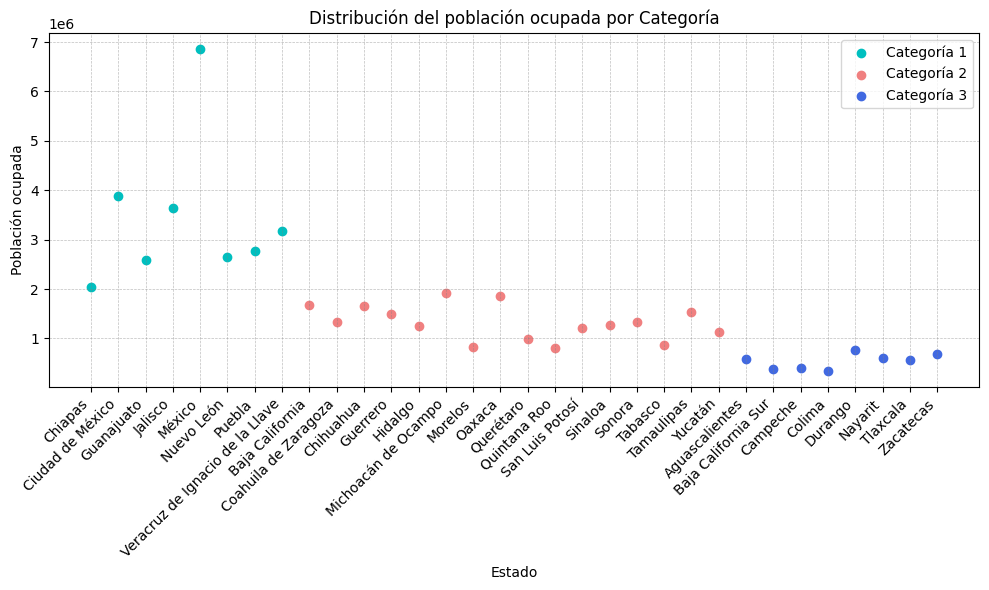

In [41]:
# Graficar cada categoría con un color diferente
plt.figure(figsize=(10, 6))

colors = {1: 'c', 2: 'lightcoral', 3: 'royalblue'}

for categoria_pea, color in colors.items():
    subset = ppd[ppd['categoria_pea'] == categoria_pea]
    plt.scatter(subset['entidad'], subset['pea_total'], label=f'Categoría {categoria_pea}', color=color)

# Otros ajustes
plt.xlabel('Estado')
plt.ylabel('Población ocupada')
plt.title('Distribución del población ocupada por Categoría')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.show()

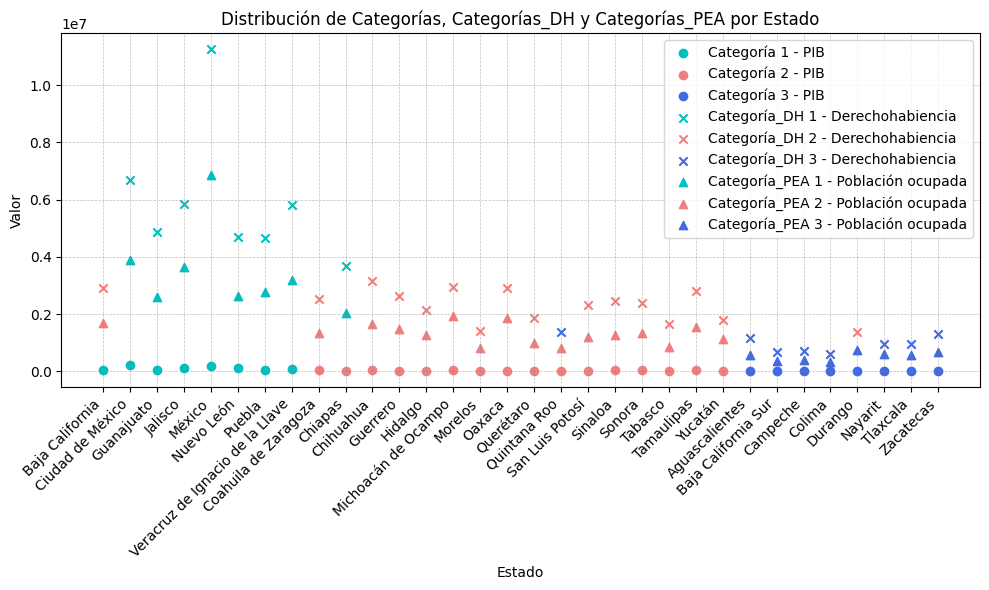

In [45]:
# Graficar las tres columnas en el mismo gráfico de dispersión
plt.figure(figsize=(10, 6))

colors = {1: 'c', 2: 'lightcoral', 3: 'royalblue'}

for categoria, color in colors.items():
    subset_pib = ppd[ppd['categoria'] == categoria]
    plt.scatter(subset_pib['entidad'], subset_pib['pib2020'], label=f'Categoría {categoria} - PIB', color=color, marker='o')

for categoria_dh, color in colors.items():
    subset_dh = ppd[ppd['categoria_dh'] == categoria_dh]
    plt.scatter(subset_dh['entidad'], subset_dh['Total'], label=f'Categoría_DH {categoria_dh} - Derechohabiencia', color=color, marker='x')

for categoria_pea, color in colors.items():
    subset_pea = ppd[ppd['categoria_pea'] == categoria_pea]
    plt.scatter(subset_pea['entidad'], subset_pea['pea_total'], label=f'Categoría_PEA {categoria_pea} - Población ocupada', color=color, marker='^')

# Otros ajustes
plt.xlabel('Estado')
plt.ylabel('Valor')
plt.title('Distribución de Categorías, Categorías_DH y Categorías_PEA por Estado')
plt.legend()
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.grid(True, linestyle='--', linewidth=0.5, color='gray', alpha=0.5)
plt.show()

In [46]:
columnas_interes = ['pib2020', 'Total', 'pea_total']

# Calcular la matriz de correlación
matriz_correlacion = ppd[columnas_interes].corr()

# Imprimir la matriz de correlación
print(matriz_correlacion)

            pib2020     Total  pea_total
pib2020    1.000000  0.877442   0.875121
Total      0.877442  1.000000   0.995952
pea_total  0.875121  0.995952   1.000000


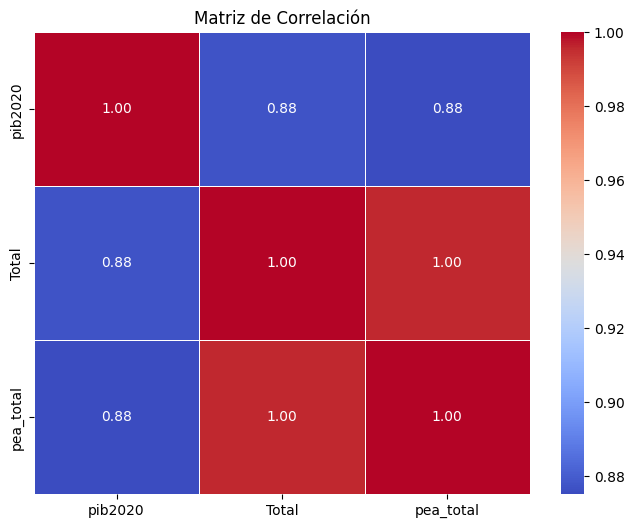

In [48]:
plt.figure(figsize=(8, 6))
sns.heatmap(matriz_correlacion, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)


plt.title('Matriz de Correlación')
plt.show()